In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:85% !important; }</style>"))
import warnings
warnings.filterwarnings('ignore')

import sys,os
sys.path.append('../')
from collections import Counter

from copy import copy,deepcopy
import itertools
from collections import Counter
from dataclasses import dataclass

import numpy as np
import pandas as pd


import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('bmh')

from tqdm import tqdm_notebook as tqdm

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

from sklearn.preprocessing import StandardScaler,PowerTransformer,MinMaxScaler,RobustScaler
from sklearn import preprocessing
from efcm.cluster import EFCM_LS1

### Helper classes

In [2]:
@dataclass
class Dataset:
    dataset_data: pd.DataFrame
    dataset_test: pd.DataFrame
    dataset_merge: pd.DataFrame
    #
    @property
    def name(self):
        return f"dataset_data, dataset_test ,dataset_merge"
    

class DataSingleton(object):
    def __new__(cls):
        """ creates a singleton object, if it is not created,
        or else returns the previous singleton object"""
        if not hasattr(cls, 'instance'):
            cls.instance = super(DataSingleton, cls).__new__(cls)
        return cls.instance

### Helper Functions

In [3]:
def create_data_book(**Kargs):
    _dict = {}
    for key, value in Kargs.items():
        _dict[key] = value
    return _dict

In [4]:
def plot_one_data(data,cols,name):
    df = data.get(name).copy()
    for c_ in range(len(cols)-1):
        fig, axes = plt.subplots(1, 2, figsize=(15, 6))
        sns.distplot(df[cols[c_]], color='g', bins=100, hist_kws={'alpha': 0.4},ax=axes[0])
        sns.distplot(df[cols[c_+1]], color='g', bins=100, hist_kws={'alpha': 0.4},ax=axes[1])
        plt.show()
    del df

In [5]:
def plot_two_data(data,cols,names_list):
    df1 = data.get(names_list[0]).copy()
    df2 = data.get(names_list[1]).copy()
    for c_ in range(len(cols)-1):
        fig, axes = plt.subplots(1, 2, figsize=(15, 6))
        sns.distplot(df1[cols[c_]], color='g', bins=100, hist_kws={'alpha': 0.4},ax=axes[0])
        axes[0].set_title(cols[c_]+" "+names_list[0])
        sns.distplot(df2[cols[c_]], color='g', bins=100, hist_kws={'alpha': 0.4},ax=axes[1])
        axes[1].set_title(cols[c_]+ " "+names_list[1])
        plt.show()
    del df1,df2

In [6]:
def plot_three_data(data,cols,names_list):
    df1 = data.get(names_list[0]).copy()
    df2 = data.get(names_list[1]).copy()
    df3 = data.get(names_list[2]).copy()
    for c_ in range(len(cols)-1):
        fig, axes = plt.subplots(1, 3, figsize=(15, 6))
        sns.distplot(df1[cols[c_]], color='g', bins=100, hist_kws={'alpha': 0.4},ax=axes[0])
        axes[0].set_title(cols[c_]+"::"+names_list[0])
        sns.distplot(df2[cols[c_]], color='g', bins=100, hist_kws={'alpha': 0.4},ax=axes[1])
        axes[1].set_title(cols[c_]+ "::"+names_list[1])
        sns.distplot(df3[cols[c_]], color='g', bins=100, hist_kws={'alpha': 0.4},ax=axes[2])
        axes[2].set_title(cols[c_]+ "::"+names_list[2])
        plt.show()
    del df1,df2,df3

In [7]:
def make_boxplot(data, inputs):

    num_inputs = len(inputs)

    fig, axs = plt.subplots(1, num_inputs, figsize=(20,10))

    for i, (ax, curve) in enumerate(zip(axs.flat, inputs), 1):
        sns.boxplot(y=data[curve], ax=ax, color='cornflowerblue', showmeans=True,  
                meanprops={"marker":"o",
                           "markerfacecolor":"white", 
                           "markeredgecolor":"black",
                          "markersize":"10"},
               flierprops={'marker':'o', 
                          'markerfacecolor':'darkgreen',
                          'markeredgecolor':'darkgreen'})
        
        ax.set_title(inputs[i-1])
        ax.set_ylabel('')

    plt.subplots_adjust(hspace=0.15, wspace=1.25)
    plt.show()

#############################################################################################################

Data Set Information: [dataset](https://archive.ics.uci.edu/ml/datasets/Image+Segmentation)

The instances were drawn randomly from a database of 7 outdoor images. The images were handsegmented to create a classification for every pixel.

Each instance is a 3x3 region.

Attribute Information:

1. region-centroid-col: the column of the center pixel of the region.
2. region-centroid-row: the row of the center pixel of the region.
3. region-pixel-count: the number of pixels in a region = 9.
4. short-line-density-5: the results of a line extractoin algorithm that counts how many lines of length 5 (any orientation) with low contrast, less than or equal to 5, go through the region.
5. short-line-density-2: same as short-line-density-5 but counts lines of high contrast, greater than 5.
6. vedge-mean: measure the contrast of horizontally adjacent pixels in the region. There are 6, the mean and standard deviation are given. This attribute is used as a vertical edge detector.
7. vegde-sd: (see 6)
8. hedge-mean: measures the contrast of vertically adjacent pixels. Used for horizontal line detection.
9. hedge-sd: (see 8).
10. intensity-mean: the average over the region of (R + G + B)/3
11. rawred-mean: the average over the region of the R value.
12. rawblue-mean: the average over the region of the B value.
13. rawgreen-mean: the average over the region of the G value.
14. exred-mean: measure the excess red: (2R - (G + B))
15. exblue-mean: measure the excess blue: (2B - (G + R))
16. exgreen-mean: measure the excess green: (2G - (R + B))
17. value-mean: 3-d nonlinear transformation of RGB. (Algorithm can be found in Foley and VanDam, Fundamentals of Interactive Computer Graphics)
18. saturatoin-mean: (see 17)
19. hue-mean: (see 17)

# Load Dataset

In [8]:
# Atributos
features = ["REGION-CENTROID-COL","REGION-CENTROID-ROW","REGION-PIXEL-COUNT","SHORT-LINE-DENSITY-5",
            "SHORT-LINE-DENSITY-2","VEDGE-MEAN","VEDGE-SD","HEDGE-MEAN","HEDGE-SD","INTENSITY-MEAN",
            "RAWRED-MEAN","RAWBLUE-MEAN","RAWGREEN-MEAN","EXRED-MEAN","EXBLUE-MEAN","EXGREEN-MEAN",
            "VALUE-MEAN","SATURATION-MEAN","HUE-MEAN"]
features = [c.replace('-','_') for c in features]

In [9]:
url_data = 'https://archive.ics.uci.edu/ml/machine-learning-databases/image/segmentation.data'
url_data_test = 'https://archive.ics.uci.edu/ml/machine-learning-databases/image/segmentation.test'

In [10]:
data_img_seg = pd.read_csv(url_data,sep=',',skiprows=4,index_col=0, names=features)#,dtype=_dtypes (url_data, sep=",", header=2,names=features)
data_test_img_seg = pd.read_csv(url_data_test,sep=',',skiprows=4,index_col=0, names=features)

### Map Target

In [11]:
def map_target(x):
    _dict = {"BRICKFACE":0 ,"CEMENT":3,"FOLIAGE":2,"GRASS":6,"PATH":5,"SKY":1,"WINDOW":4}
    return _dict.get(x)

In [12]:
data_img_seg.reset_index(inplace= True)
data_img_seg.rename({'index': 'Target'},inplace= True, axis=1)
data_img_seg['Target'] = data_img_seg.Target.apply(lambda x: map_target(x))

data_test_img_seg.reset_index(inplace= True)
data_test_img_seg.rename({'index': 'Target'},inplace= True, axis=1)
data_test_img_seg['Target'] = data_test_img_seg.Target.apply(lambda x: map_target(x))


### Select Features and Target

In [13]:
col_data = [c for c in data_img_seg.columns.to_list() if c not in ['REGION_CENTROID_COL',
                                                                   'REGION_CENTROID_ROW',
                                                                   'REGION_PIXEL_COUNT',]]
drop_cols = ['REGION_CENTROID_COL','REGION_CENTROID_ROW','REGION_PIXEL_COUNT']
features = [c for c in col_data if c not in ['Target','Target_Cat']]
target = ['Target']

In [14]:
data_img_seg.drop(columns=drop_cols,inplace=True)
data_test_img_seg.drop(columns=drop_cols,inplace=True)

### Merge datasets

In [15]:
data_merge = np.array([],dtype='float64')
for k in range(7):
    data_values = data_img_seg[data_img_seg['Target']==k].drop(columns='Target').values.copy()
    test_values = data_test_img_seg[data_test_img_seg['Target']==k].drop(columns='Target').values.copy()
    try:
        data_merge = np.vstack ((data_merge,data_values))
    except:
        data_merge = data_values.copy()
    data_merge = np.vstack ((data_merge,test_values))

In [16]:
data_merge = pd.DataFrame(data_merge,columns=features)
data_merge['Target'] = np.repeat(np.array([[0,1,2,3,4,5,6]]), 330) # 330 <-- número de instâncias por classes
data_merge.head()

,SHORT_LINE_DENSITY_5,SHORT_LINE_DENSITY_2,VEDGE_MEAN,VEDGE_SD,HEDGE_MEAN,HEDGE_SD,INTENSITY_MEAN,RAWRED_MEAN,RAWBLUE_MEAN,RAWGREEN_MEAN,EXRED_MEAN,EXBLUE_MEAN,EXGREEN_MEAN,VALUE_MEAN,SATURATION_MEAN,HUE_MEAN,Target
0,0.0,0.0,0.277778,0.062963,0.666667,0.311111,6.185185,7.333334,7.666666,3.555556,3.444444,4.444445,-7.888889,7.777778,0.545635,-1.121818,0
1,0.0,0.0,0.333333,0.266667,0.500000,0.077778,6.666666,8.333334,7.777778,3.888889,5.000000,3.333333,-8.333333,8.444445,0.538580,-0.924817,0
2,0.0,0.0,0.277778,0.107407,0.833333,0.522222,6.111111,7.555555,7.222222,3.555556,4.333334,3.333333,-7.666666,7.555555,0.532628,-0.965946,0
3,0.0,0.0,0.500000,0.166667,1.111111,0.474074,5.851852,7.777778,6.444445,3.333333,5.777778,1.777778,-7.555555,7.777778,0.573633,-0.744272,0
4,0.0,0.0,0.722222,0.374074,0.888889,0.429629,6.037037,7.000000,7.666666,3.444444,2.888889,4.888889,-7.777778,7.888889,0.562919,-1.175773,0


### Datasets collections

In [17]:
datasets = create_data_book(data=data_img_seg,test=data_test_img_seg,merge=data_merge)

### Dataset Info

In [18]:
datasets.get('data').info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 210 entries, 0 to 209
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Target                210 non-null    int64  
 1   SHORT_LINE_DENSITY_5  210 non-null    float64
 2   SHORT_LINE_DENSITY_2  210 non-null    float64
 3   VEDGE_MEAN            210 non-null    float64
 4   VEDGE_SD              210 non-null    float64
 5   HEDGE_MEAN            210 non-null    float64
 6   HEDGE_SD              210 non-null    float64
 7   INTENSITY_MEAN        210 non-null    float64
 8   RAWRED_MEAN           210 non-null    float64
 9   RAWBLUE_MEAN          210 non-null    float64
 10  RAWGREEN_MEAN         210 non-null    float64
 11  EXRED_MEAN            210 non-null    float64
 12  EXBLUE_MEAN           210 non-null    float64
 13  EXGREEN_MEAN          210 non-null    float64
 14  VALUE_MEAN            210 non-null    float64
 15  SATURATION_MEAN       2

In [19]:
datasets.get('test').info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2100 entries, 0 to 2099
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Target                2100 non-null   int64  
 1   SHORT_LINE_DENSITY_5  2100 non-null   float64
 2   SHORT_LINE_DENSITY_2  2100 non-null   float64
 3   VEDGE_MEAN            2100 non-null   float64
 4   VEDGE_SD              2100 non-null   float64
 5   HEDGE_MEAN            2100 non-null   float64
 6   HEDGE_SD              2100 non-null   float64
 7   INTENSITY_MEAN        2100 non-null   float64
 8   RAWRED_MEAN           2100 non-null   float64
 9   RAWBLUE_MEAN          2100 non-null   float64
 10  RAWGREEN_MEAN         2100 non-null   float64
 11  EXRED_MEAN            2100 non-null   float64
 12  EXBLUE_MEAN           2100 non-null   float64
 13  EXGREEN_MEAN          2100 non-null   float64
 14  VALUE_MEAN            2100 non-null   float64
 15  SATURATION_MEAN      

In [20]:
datasets.get('merge').info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2310 entries, 0 to 2309
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   SHORT_LINE_DENSITY_5  2310 non-null   float64
 1   SHORT_LINE_DENSITY_2  2310 non-null   float64
 2   VEDGE_MEAN            2310 non-null   float64
 3   VEDGE_SD              2310 non-null   float64
 4   HEDGE_MEAN            2310 non-null   float64
 5   HEDGE_SD              2310 non-null   float64
 6   INTENSITY_MEAN        2310 non-null   float64
 7   RAWRED_MEAN           2310 non-null   float64
 8   RAWBLUE_MEAN          2310 non-null   float64
 9   RAWGREEN_MEAN         2310 non-null   float64
 10  EXRED_MEAN            2310 non-null   float64
 11  EXBLUE_MEAN           2310 non-null   float64
 12  EXGREEN_MEAN          2310 non-null   float64
 13  VALUE_MEAN            2310 non-null   float64
 14  SATURATION_MEAN       2310 non-null   float64
 15  HUE_MEAN             

### Dataset view

In [21]:
datasets.get('data').head()

,Target,SHORT_LINE_DENSITY_5,SHORT_LINE_DENSITY_2,VEDGE_MEAN,VEDGE_SD,HEDGE_MEAN,HEDGE_SD,INTENSITY_MEAN,RAWRED_MEAN,RAWBLUE_MEAN,RAWGREEN_MEAN,EXRED_MEAN,EXBLUE_MEAN,EXGREEN_MEAN,VALUE_MEAN,SATURATION_MEAN,HUE_MEAN
0,0,0.0,0.0,0.277778,0.062963,0.666667,0.311111,6.185185,7.333334,7.666666,3.555556,3.444444,4.444445,-7.888889,7.777778,0.545635,-1.121818
1,0,0.0,0.0,0.333333,0.266667,0.500000,0.077778,6.666666,8.333334,7.777778,3.888889,5.000000,3.333333,-8.333333,8.444445,0.538580,-0.924817
2,0,0.0,0.0,0.277778,0.107407,0.833333,0.522222,6.111111,7.555555,7.222222,3.555556,4.333334,3.333333,-7.666666,7.555555,0.532628,-0.965946
3,0,0.0,0.0,0.500000,0.166667,1.111111,0.474074,5.851852,7.777778,6.444445,3.333333,5.777778,1.777778,-7.555555,7.777778,0.573633,-0.744272
4,0,0.0,0.0,0.722222,0.374074,0.888889,0.429629,6.037037,7.000000,7.666666,3.444444,2.888889,4.888889,-7.777778,7.888889,0.562919,-1.175773


In [22]:
datasets.get('test').head()

,Target,SHORT_LINE_DENSITY_5,SHORT_LINE_DENSITY_2,VEDGE_MEAN,VEDGE_SD,HEDGE_MEAN,HEDGE_SD,INTENSITY_MEAN,RAWRED_MEAN,RAWBLUE_MEAN,RAWGREEN_MEAN,EXRED_MEAN,EXBLUE_MEAN,EXGREEN_MEAN,VALUE_MEAN,SATURATION_MEAN,HUE_MEAN
0,6,0.0,0.0,1.000000,0.666667,1.222222,1.186342,12.925926,10.888889,9.222222,18.666668,-6.111111,-11.111111,17.222221,18.666668,0.508139,1.910864
1,6,0.0,0.0,1.111111,0.720082,1.444444,0.750309,13.740741,11.666667,10.333334,19.222221,-6.222222,-10.222222,16.444445,19.222221,0.463329,1.941465
2,6,0.0,0.0,3.388889,2.195113,3.000000,1.520234,12.259259,10.333334,9.333334,17.111110,-5.777778,-8.777778,14.555555,17.111110,0.480149,1.987902
3,6,0.0,0.0,1.277778,1.254621,1.000000,0.894427,12.703704,11.000000,9.000000,18.111110,-5.111111,-11.111111,16.222221,18.111110,0.500966,1.875362
4,6,0.0,0.0,1.166667,0.691215,1.166667,1.005540,15.592592,13.888889,11.777778,21.111110,-5.111111,-11.444445,16.555555,21.111110,0.442661,1.863654


In [23]:
datasets.get('merge').head()

,SHORT_LINE_DENSITY_5,SHORT_LINE_DENSITY_2,VEDGE_MEAN,VEDGE_SD,HEDGE_MEAN,HEDGE_SD,INTENSITY_MEAN,RAWRED_MEAN,RAWBLUE_MEAN,RAWGREEN_MEAN,EXRED_MEAN,EXBLUE_MEAN,EXGREEN_MEAN,VALUE_MEAN,SATURATION_MEAN,HUE_MEAN,Target
0,0.0,0.0,0.277778,0.062963,0.666667,0.311111,6.185185,7.333334,7.666666,3.555556,3.444444,4.444445,-7.888889,7.777778,0.545635,-1.121818,0
1,0.0,0.0,0.333333,0.266667,0.500000,0.077778,6.666666,8.333334,7.777778,3.888889,5.000000,3.333333,-8.333333,8.444445,0.538580,-0.924817,0
2,0.0,0.0,0.277778,0.107407,0.833333,0.522222,6.111111,7.555555,7.222222,3.555556,4.333334,3.333333,-7.666666,7.555555,0.532628,-0.965946,0
3,0.0,0.0,0.500000,0.166667,1.111111,0.474074,5.851852,7.777778,6.444445,3.333333,5.777778,1.777778,-7.555555,7.777778,0.573633,-0.744272,0
4,0.0,0.0,0.722222,0.374074,0.888889,0.429629,6.037037,7.000000,7.666666,3.444444,2.888889,4.888889,-7.777778,7.888889,0.562919,-1.175773,0


### Describe data

In [24]:
datasets.get('data').iloc[:,1:].describe().T

,count,mean,std,min,25%,50%,75%,max
SHORT_LINE_DENSITY_5,210.0,0.008466,0.029549,0.000000,0.000000,0.000000,0.000000,0.111111
SHORT_LINE_DENSITY_2,210.0,0.006349,0.030077,0.000000,0.000000,0.000000,0.000000,0.222222
VEDGE_MEAN,210.0,1.925132,3.158211,0.000000,0.666667,1.222222,1.888890,25.500000
VEDGE_SD,210.0,5.719529,43.495942,0.000000,0.400921,0.828695,1.676634,572.996400
HEDGE_MEAN,210.0,2.604233,4.798268,0.000000,0.777779,1.388889,2.597221,44.722225
HEDGE_SD,210.0,11.638377,97.390023,0.000000,0.410816,0.913176,1.980485,1386.329200
INTENSITY_MEAN,210.0,37.091005,38.677168,0.000000,6.453704,21.314816,52.629629,143.444440
RAWRED_MEAN,210.0,32.967725,35.540563,0.000000,7.000000,18.611112,46.750000,136.888890
RAWBLUE_MEAN,210.0,44.011112,43.804447,0.000000,8.277778,26.833334,64.194447,150.888890
RAWGREEN_MEAN,210.0,34.294180,37.057003,0.000000,3.805555,20.000000,46.472223,142.555560


In [25]:
datasets.get('test').iloc[:,1:].describe().T

,count,mean,std,min,25%,50%,75%,max
SHORT_LINE_DENSITY_5,2100.0,0.014921,0.041024,0.000000e+00,0.000000,0.000000,0.000000,0.333333
SHORT_LINE_DENSITY_2,2100.0,0.004550,0.023573,0.000000e+00,0.000000,0.000000,0.000000,0.222222
VEDGE_MEAN,2100.0,1.890820,2.649453,0.000000e+00,0.722222,1.277776,2.222221,29.222221
VEDGE_SD,2100.0,5.708299,44.989359,0.000000e+00,0.349603,0.833333,1.807406,991.718400
HEDGE_MEAN,2100.0,2.406772,3.469954,0.000000e+00,0.833332,1.444444,2.555556,44.722225
HEDGE_SD,2100.0,7.904224,53.471074,-1.589457e-08,0.421638,0.989744,2.251852,1386.329200
INTENSITY_MEAN,2100.0,37.047654,38.135291,0.000000e+00,7.472222,21.666666,53.277778,143.444440
RAWRED_MEAN,2100.0,32.806667,34.994538,0.000000e+00,7.000000,19.666668,47.333332,137.111110
RAWBLUE_MEAN,2100.0,44.205556,43.510119,0.000000e+00,9.666667,27.777779,65.000000,150.888890
RAWGREEN_MEAN,2100.0,34.130741,36.303768,0.000000e+00,6.222222,20.444445,46.388888,142.555560


In [26]:
datasets.get('merge').iloc[:,:-1].describe().T

,count,mean,std,min,25%,50%,75%,max
SHORT_LINE_DENSITY_5,2310.0,0.014334,0.040154,0.000000e+00,0.000000,0.000000,0.000000,0.333333
SHORT_LINE_DENSITY_2,2310.0,0.004714,0.024234,0.000000e+00,0.000000,0.000000,0.000000,0.222222
VEDGE_MEAN,2310.0,1.893939,2.698908,0.000000e+00,0.722222,1.222224,2.166667,29.222221
VEDGE_SD,2310.0,5.709320,44.846457,0.000000e+00,0.355555,0.833333,1.806367,991.718400
HEDGE_MEAN,2310.0,2.424723,3.610084,0.000000e+00,0.777780,1.444444,2.555556,44.722225
HEDGE_SD,2310.0,8.243692,58.811517,-1.589457e-08,0.421637,0.962963,2.183269,1386.329200
INTENSITY_MEAN,2310.0,37.051595,38.176410,0.000000e+00,7.296296,21.592592,53.212964,143.444440
RAWRED_MEAN,2310.0,32.821308,35.036774,0.000000e+00,7.000000,19.555555,47.333332,137.111110
RAWBLUE_MEAN,2310.0,44.187879,43.527461,0.000000e+00,9.555555,27.666667,64.888890,150.888890
RAWGREEN_MEAN,2310.0,34.145599,36.364773,0.000000e+00,6.027778,20.333334,46.500001,142.555560


### Visualization Raw data

In [27]:
#make_boxplot(data_test_img_seg, data_test_img_seg.columns[4:])

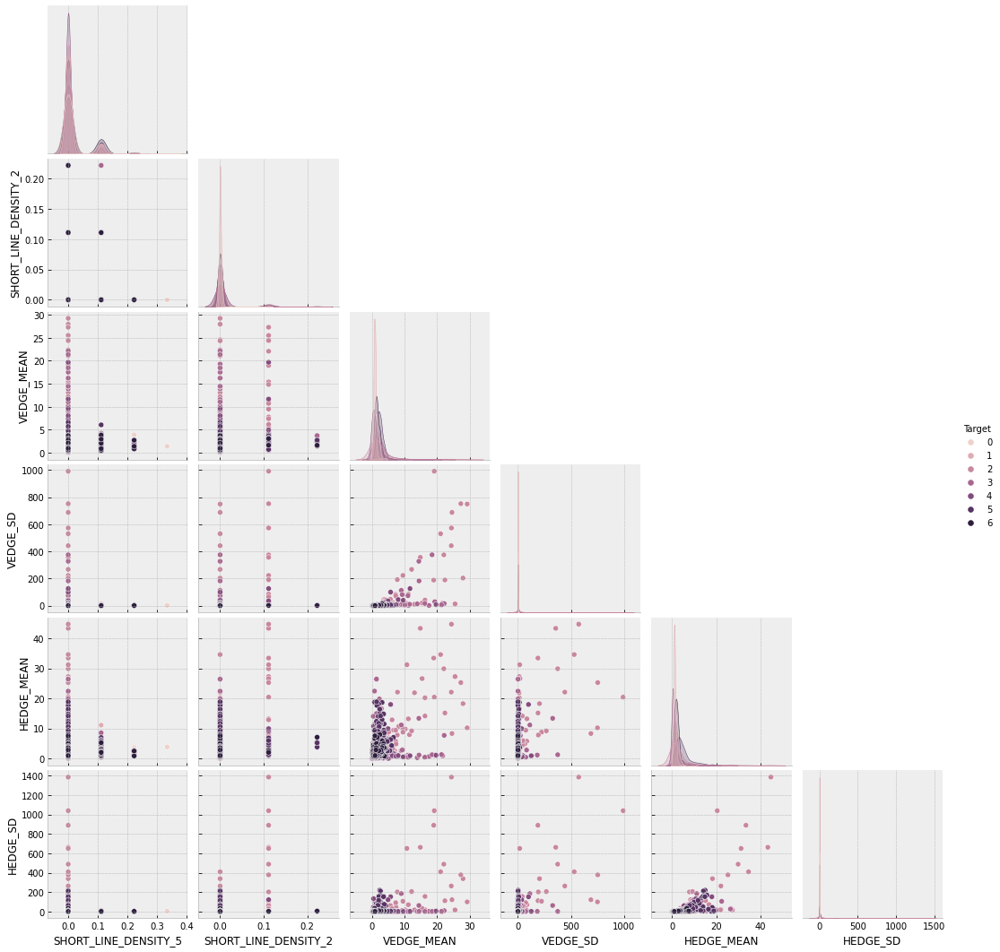

In [28]:
#sns.set_palette('husl')
sns.pairplot(datasets.get('merge'), vars=features[0:6],hue='Target',corner=True, diag_kind="kde",diag_kws=dict(shade=True))

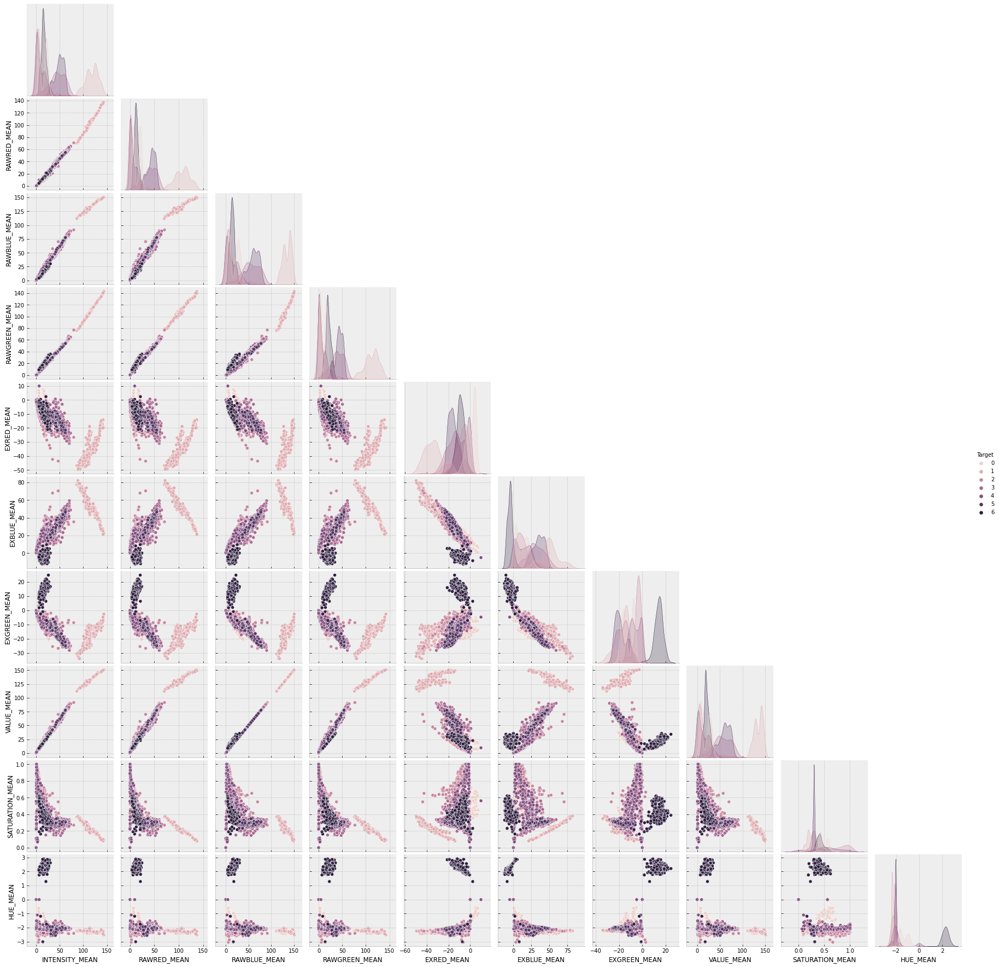

In [29]:
sns.pairplot(datasets.get('merge'), vars=features[6:],hue='Target',corner=True, diag_kind="kde",diag_kws=dict(shade=True))

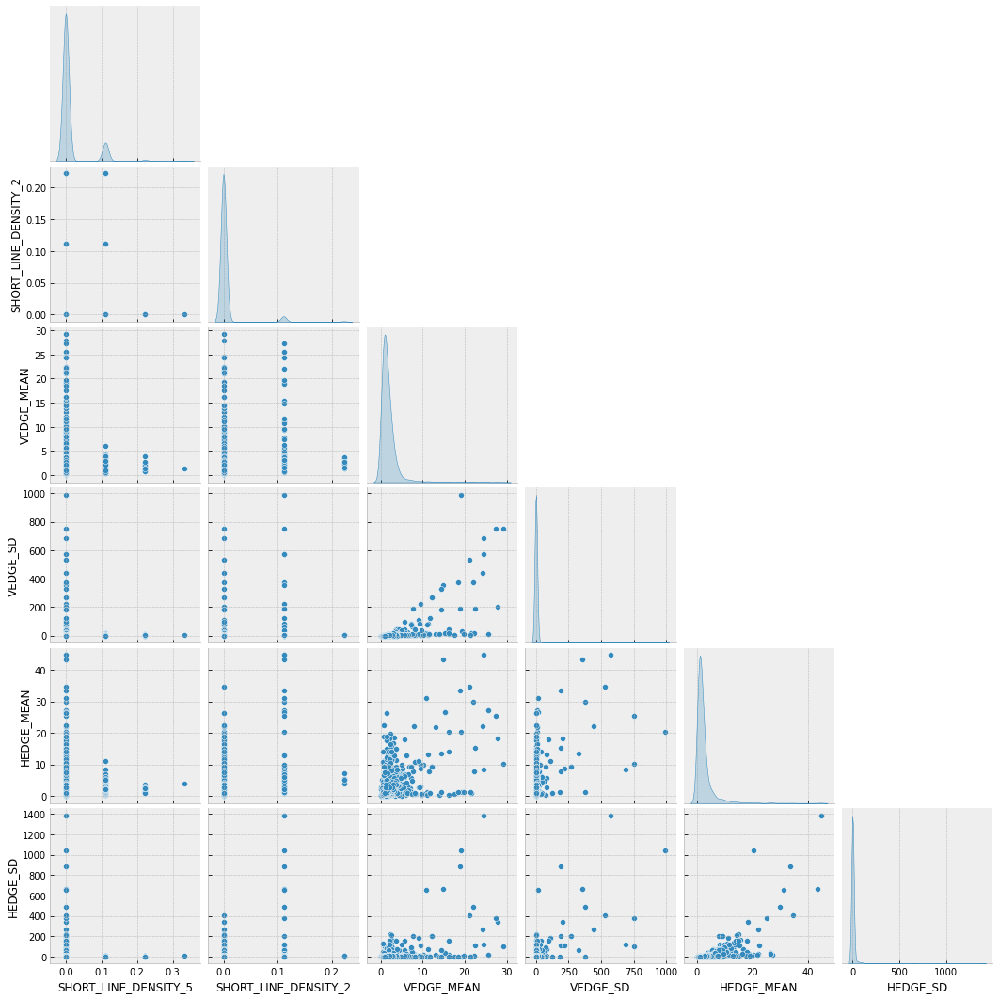

In [30]:
#sns.set_palette('husl')
sns.pairplot(datasets.get('merge'), vars=features[0:6], diag_kind="kde",corner=True,diag_kws=dict(shade=True))

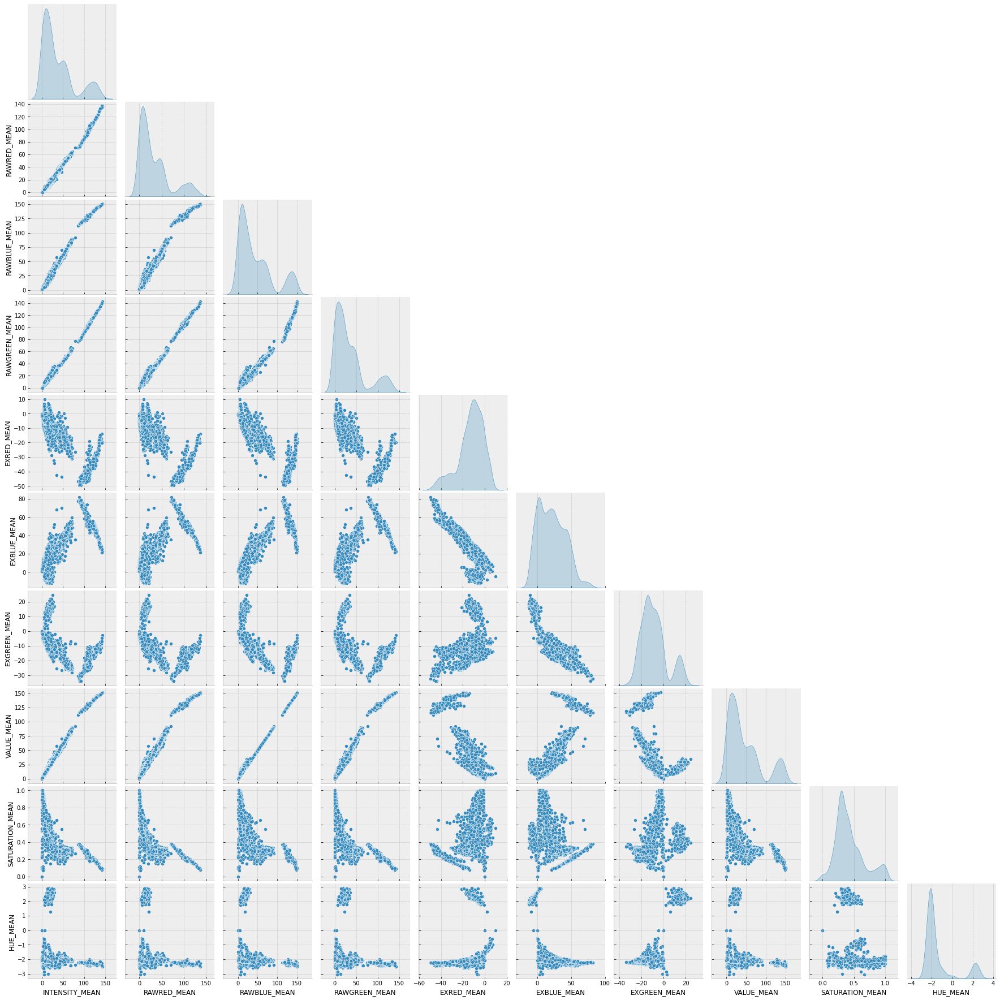

In [31]:
sns.pairplot(datasets.get('merge'), vars=features[6:], diag_kind="kde",corner=True,diag_kws=dict(shade=True))

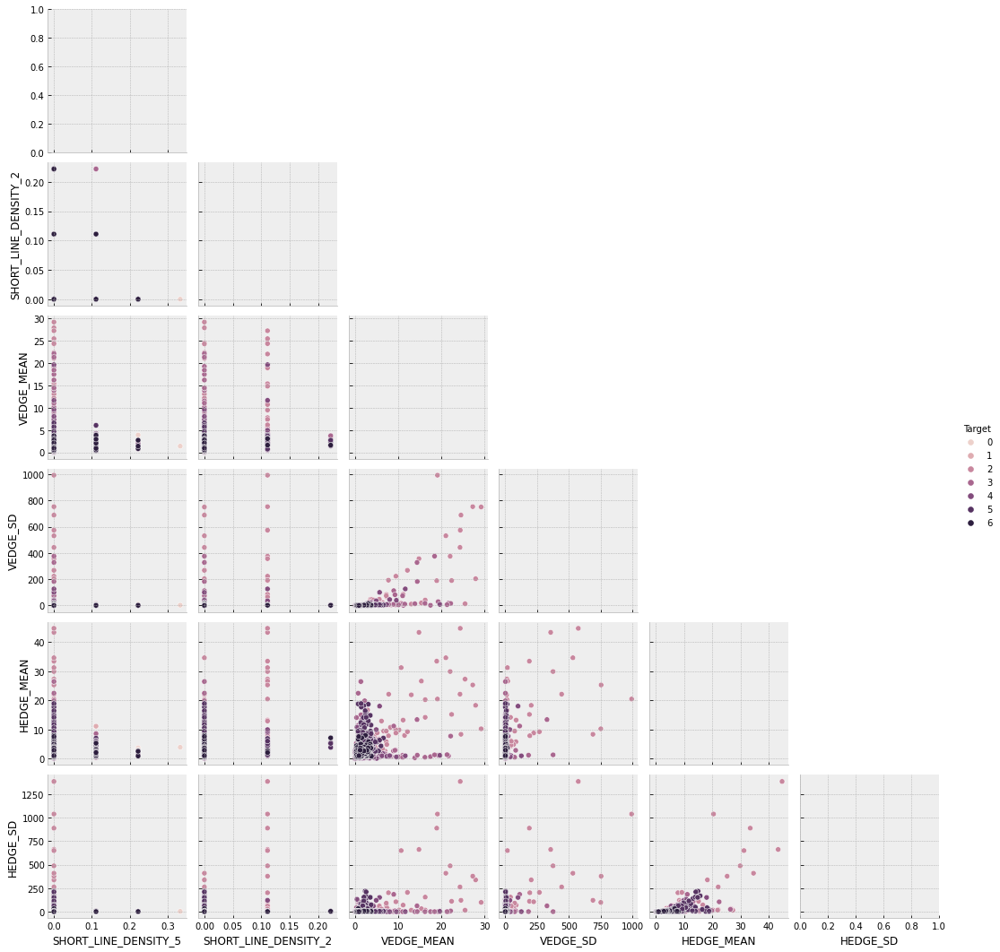

In [32]:
sns.pairplot(datasets.get('merge'), vars=features[0:6],hue='Target', diag_kind="reg",corner=True,diag_kws=dict(shade=True))

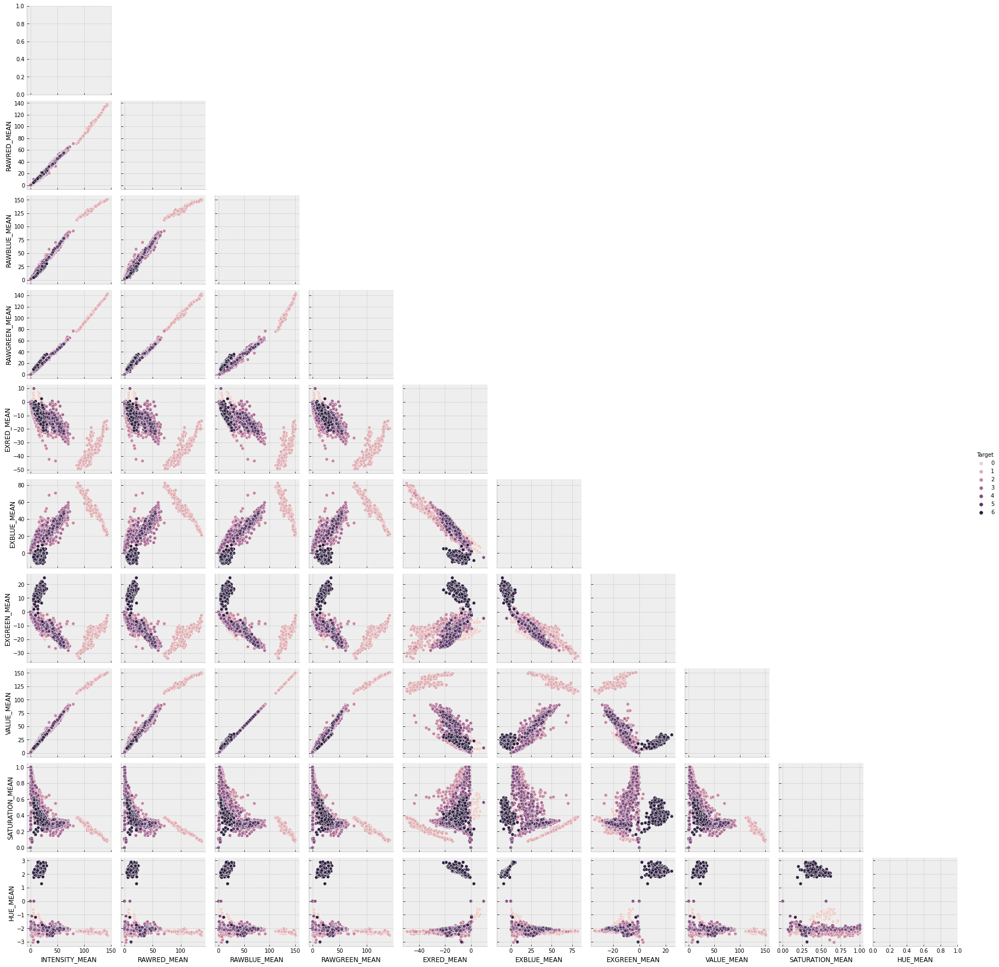

In [33]:
sns.pairplot(datasets.get('merge'), vars=features[6:],hue='Target', diag_kind="reg",corner=True,diag_kws=dict(shade=True))

<Figure size 1440x2160 with 0 Axes>

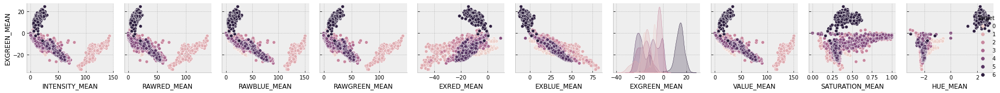

In [34]:
plt.figure(figsize = (20, 30))
sns.pairplot(datasets.get('merge'),x_vars=features[6:],y_vars=['EXGREEN_MEAN'],hue='Target')
plt.tight_layout()

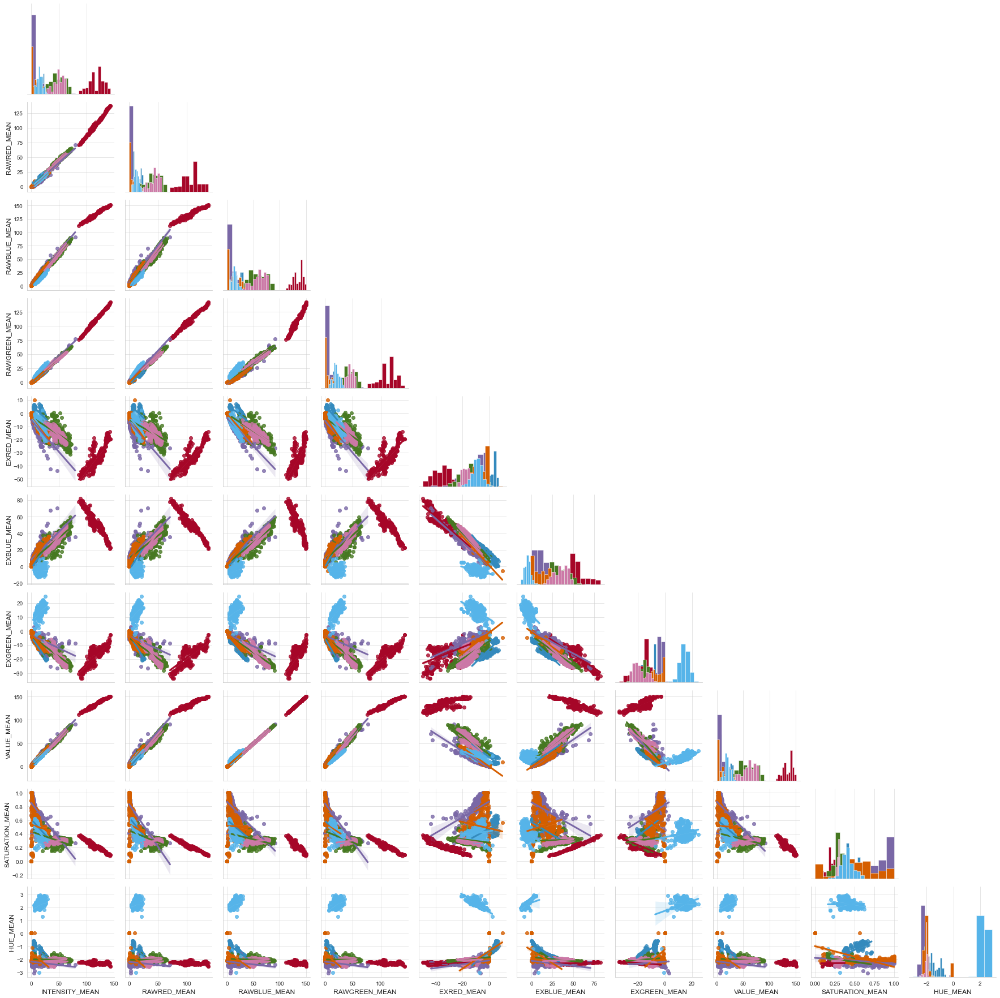

In [35]:
sns.set_style('whitegrid')
g = sns.PairGrid(datasets.get('merge').drop(columns=features[0:6]),corner=True,hue='Target')
#g.map_upper(sns.regplot,order=2)
g.map_lower(sns.regplot,order=1)
g.map_diag(plt.hist)

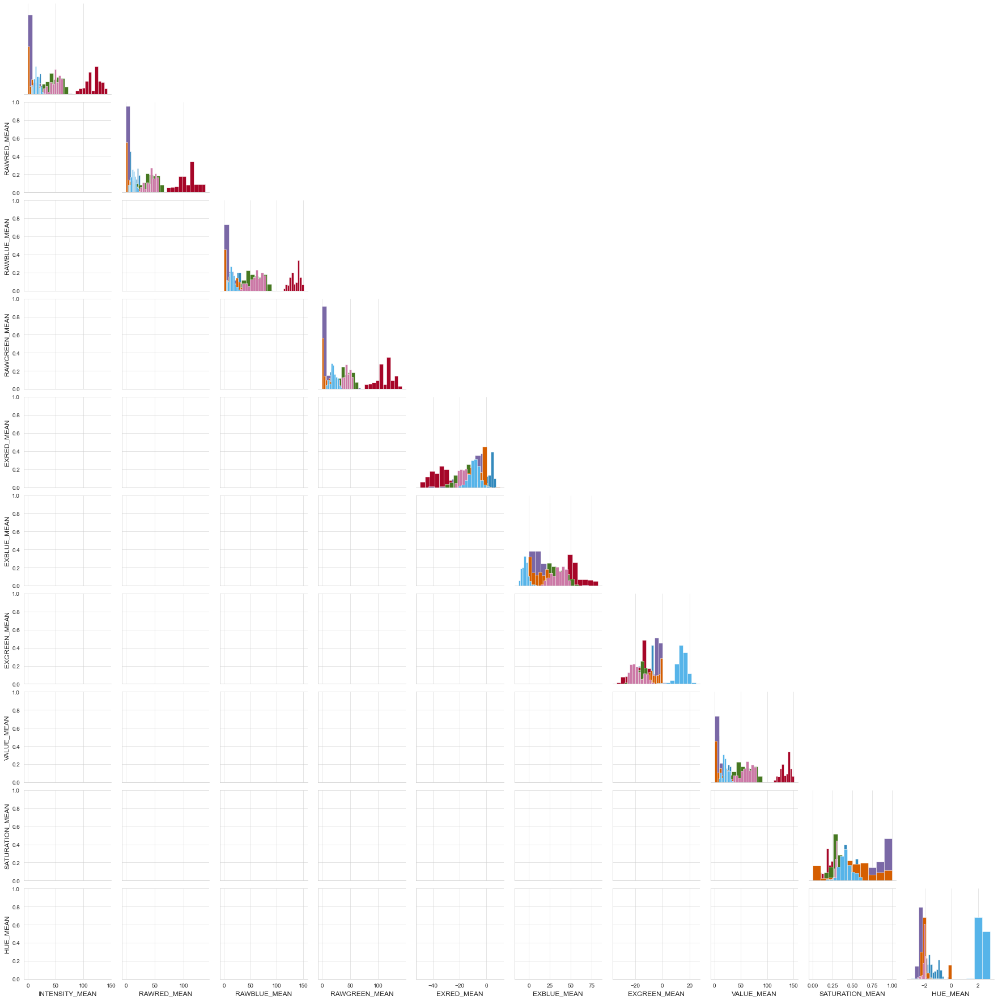

In [36]:
sns.set_style('whitegrid')
g = sns.PairGrid(datasets.get('merge').drop(columns=features[0:6]),corner=True,hue='Target')
g.map_upper(sns.regplot,order=2)
#g.map_lower(sns.regplot,order=1)
g.map_diag(plt.hist)

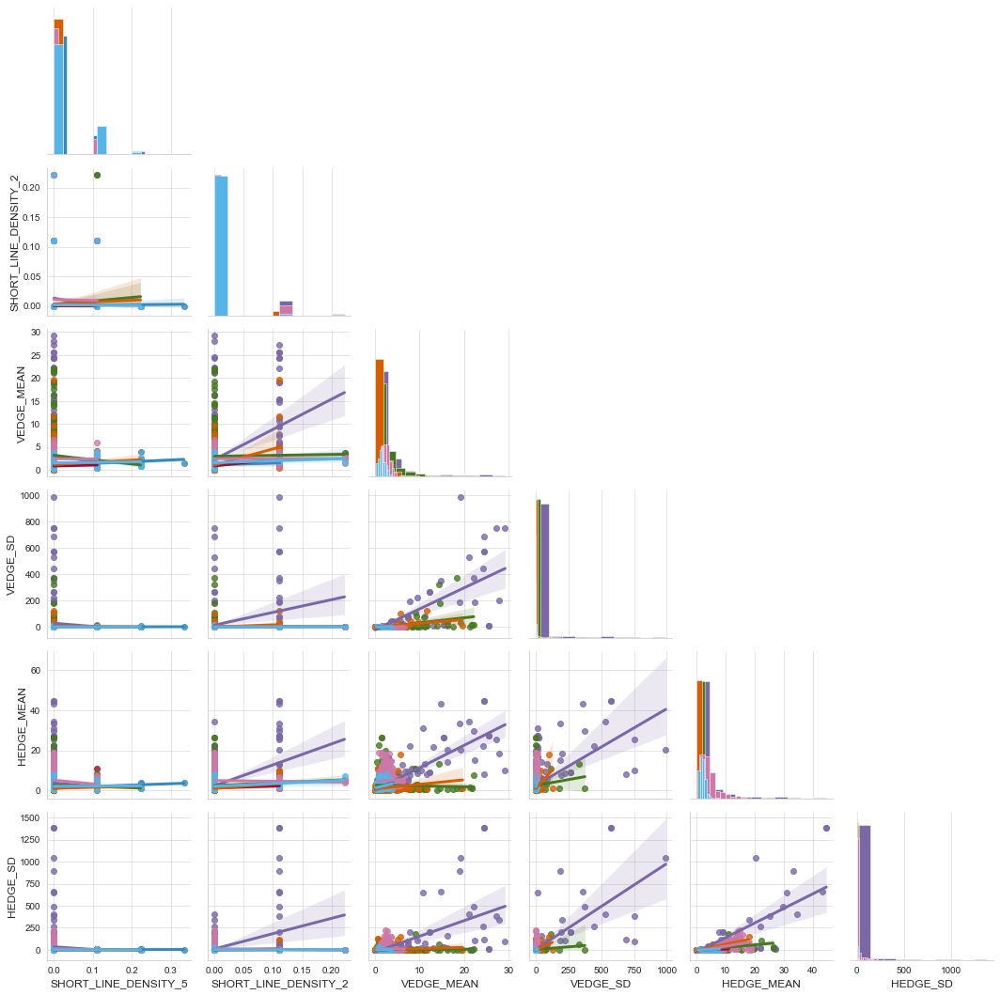

In [37]:
sns.set_style('whitegrid')
g = sns.PairGrid(datasets.get('merge').drop(columns=features[6:]),corner=True,hue='Target')
#g.map_upper(sns.regplot,order=2)
g.map_lower(sns.regplot,order=1)
g.map_diag(plt.hist)

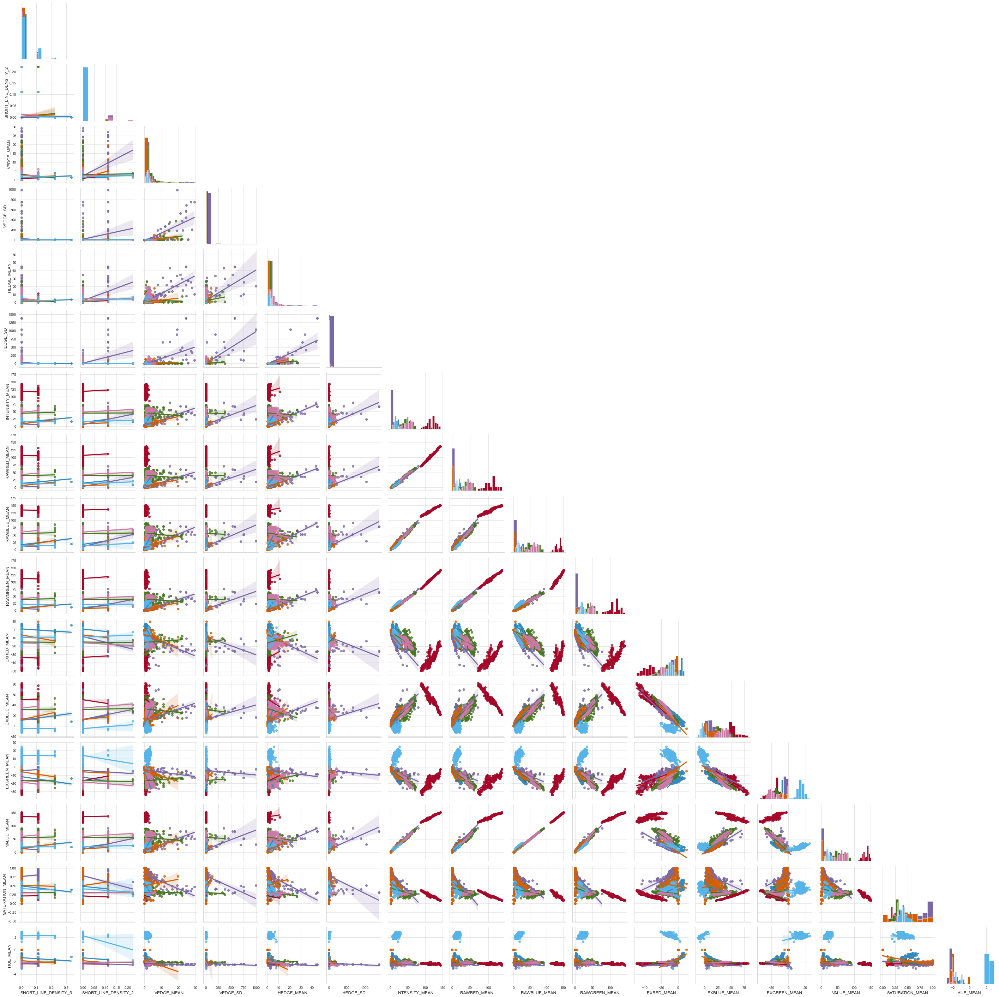

In [38]:
sns.set_style('whitegrid')
g = sns.PairGrid(datasets.get('merge'),corner=True,hue='Target')
#g.map_upper(sns.regplot,order=2)
g.map_lower(sns.regplot,order=1)
g.map_diag(plt.hist)

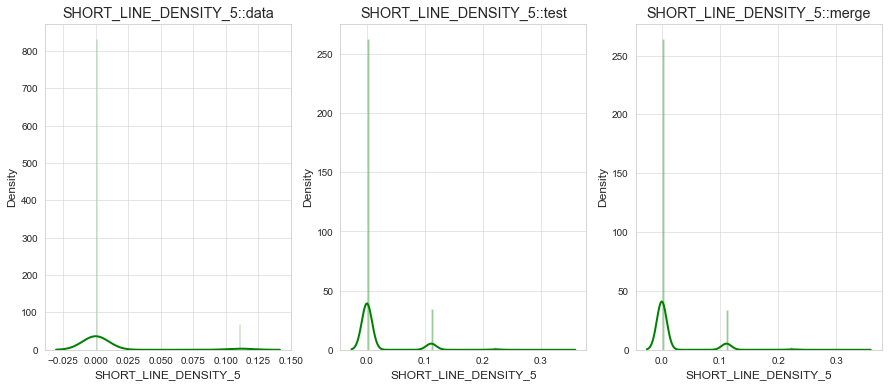

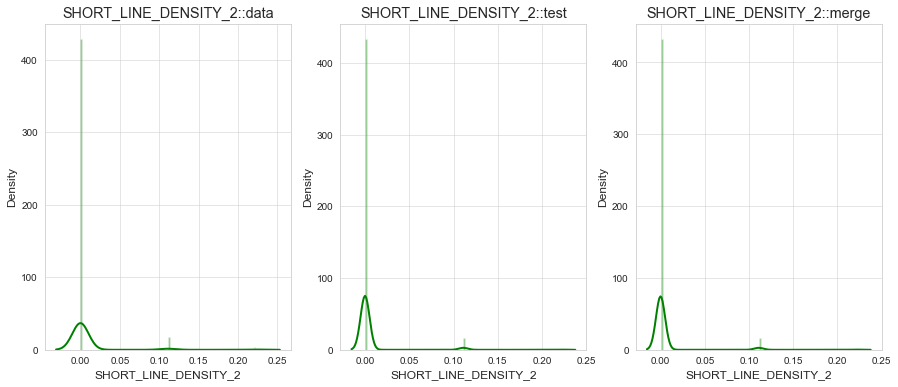

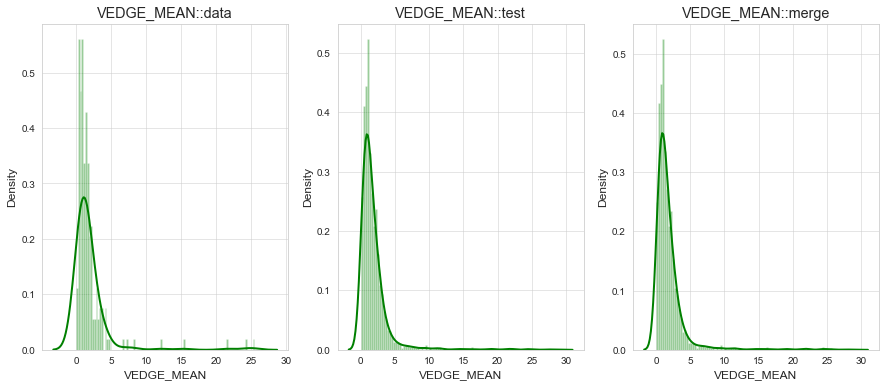

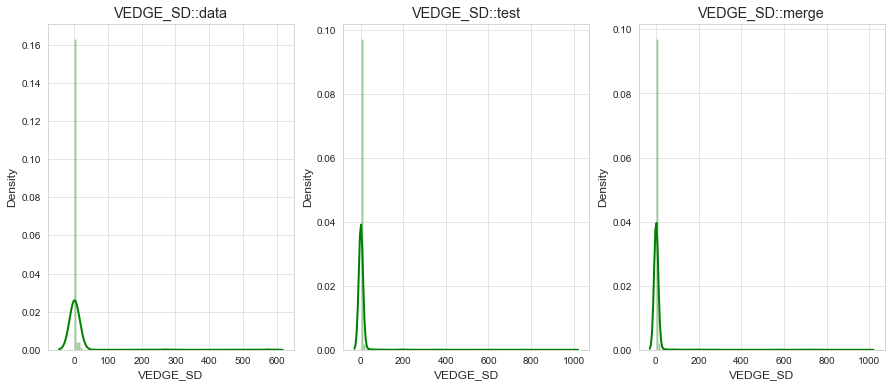

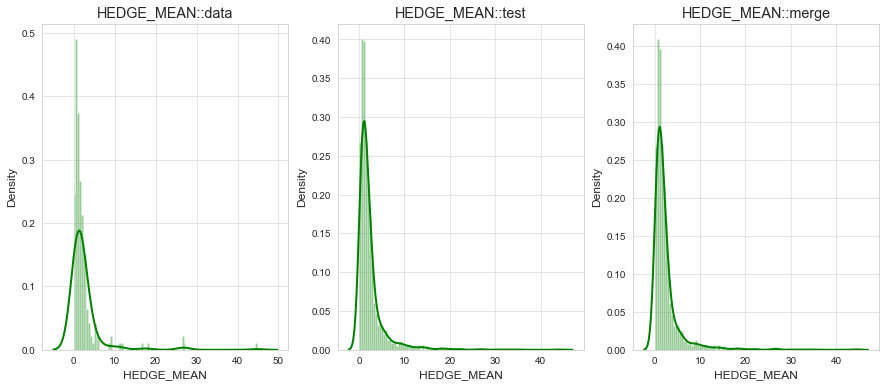

...

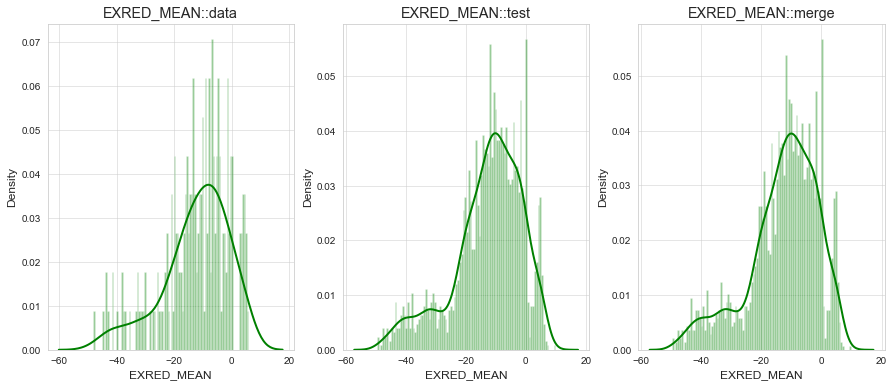

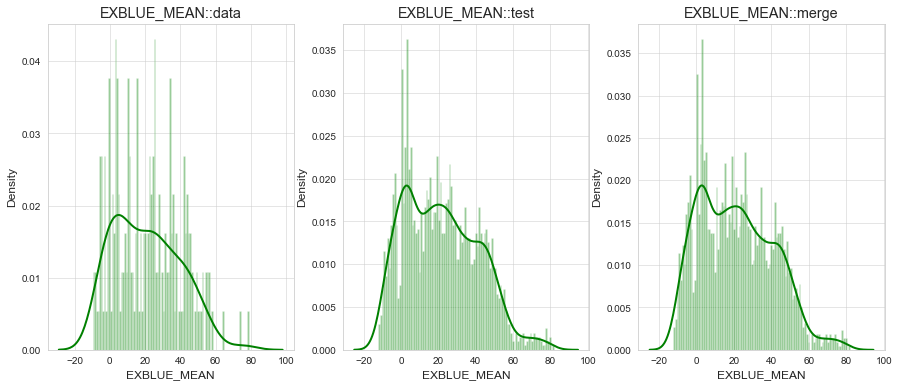

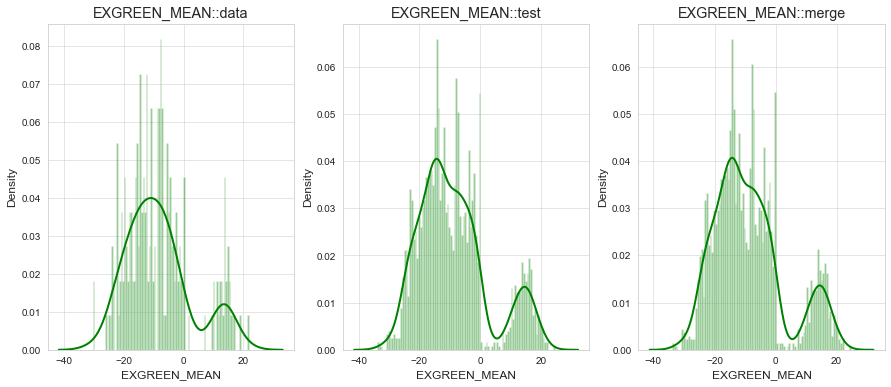

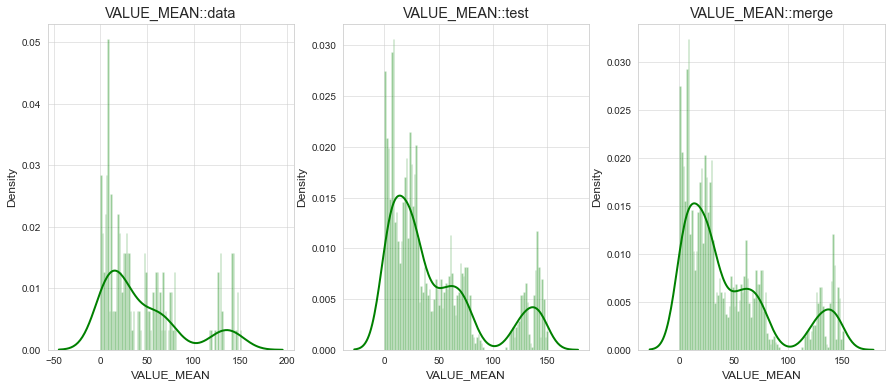

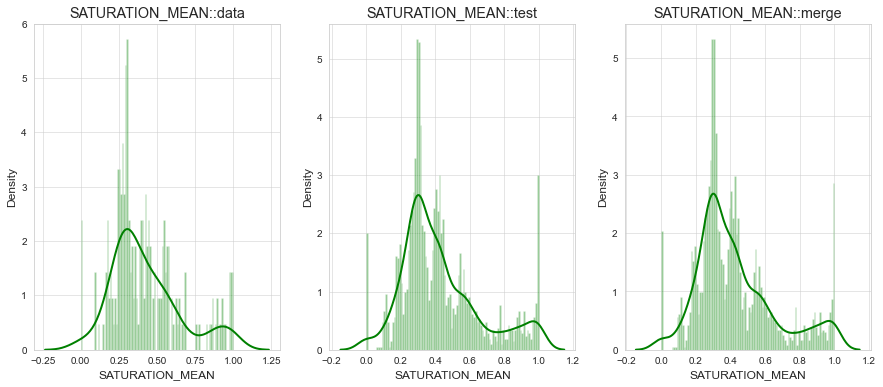

In [39]:
plot_three_data(datasets,features,['data','test','merge'])

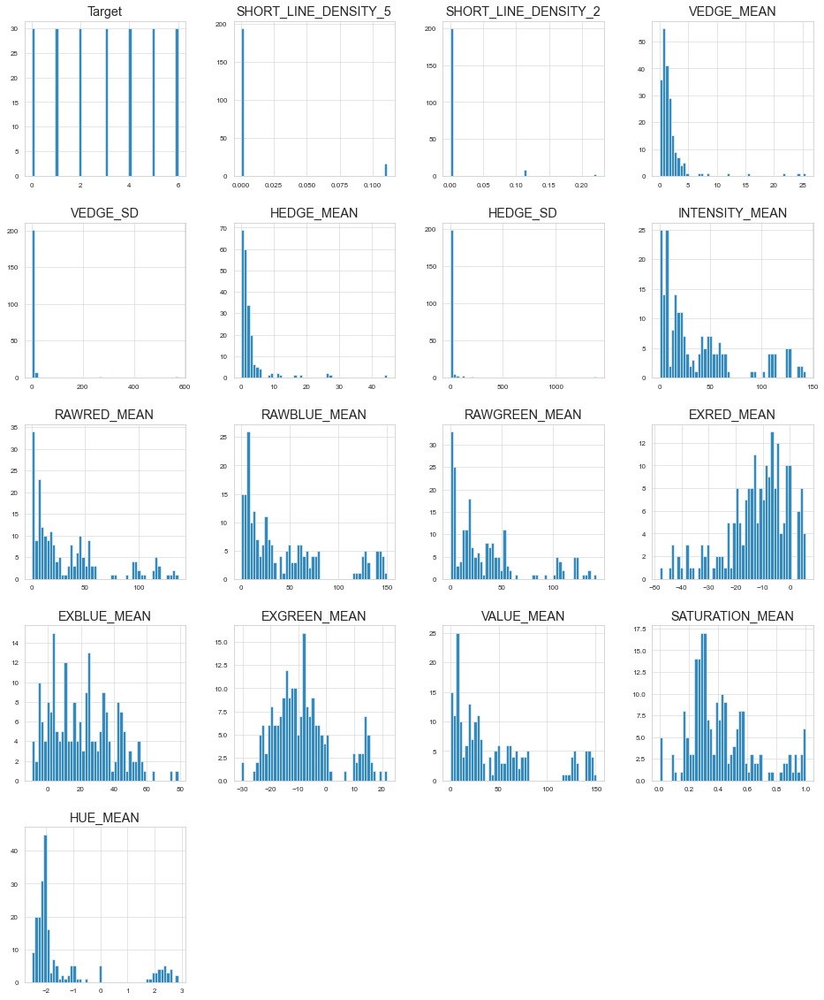

In [40]:
datasets.get('data').hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8);

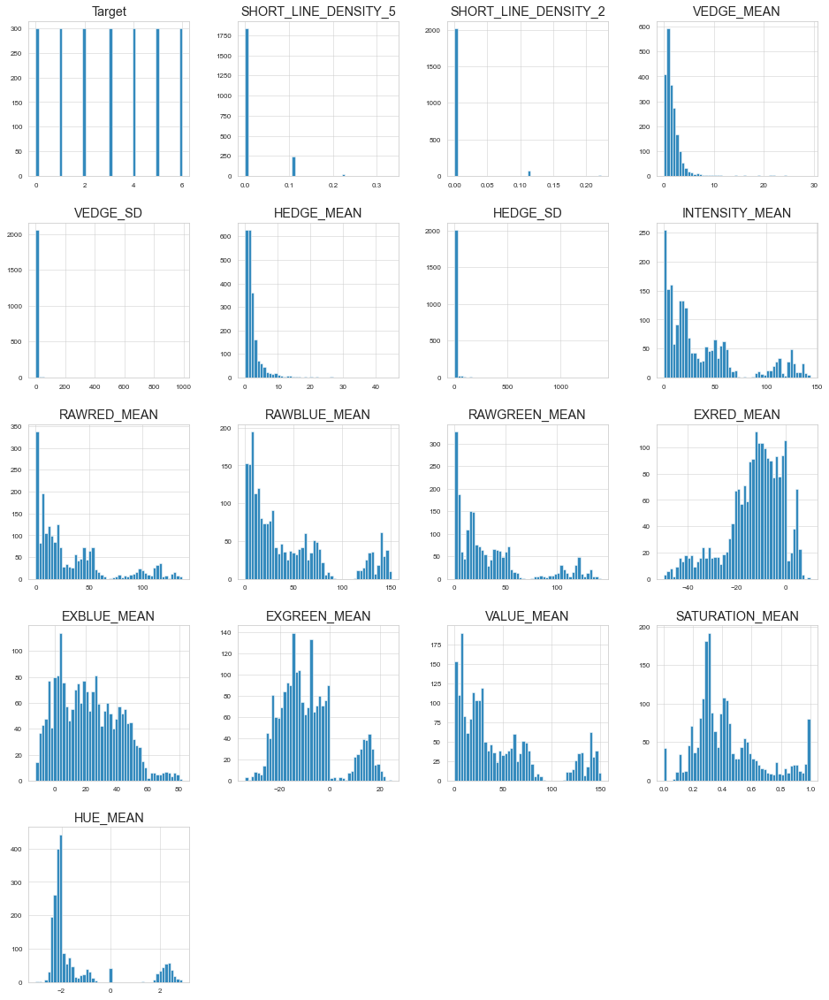

In [41]:
datasets.get('test').hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8);

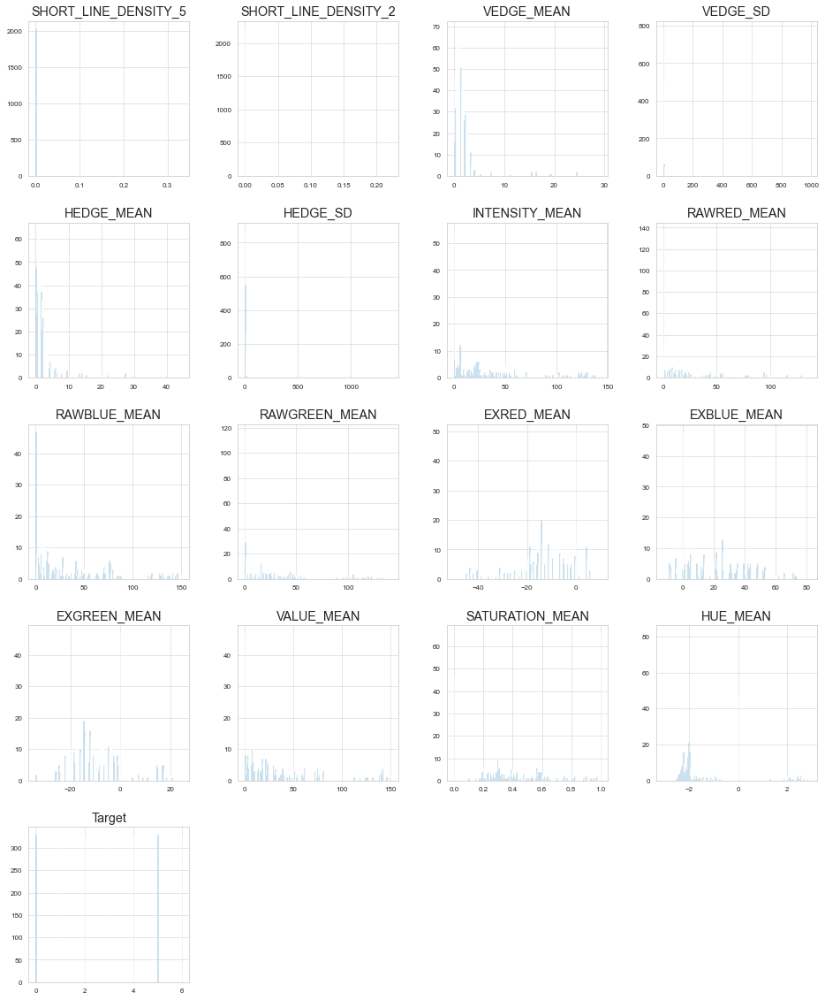

In [42]:
datasets.get('merge').hist(figsize=(16, 20), bins=2000, xlabelsize=8, ylabelsize=8);

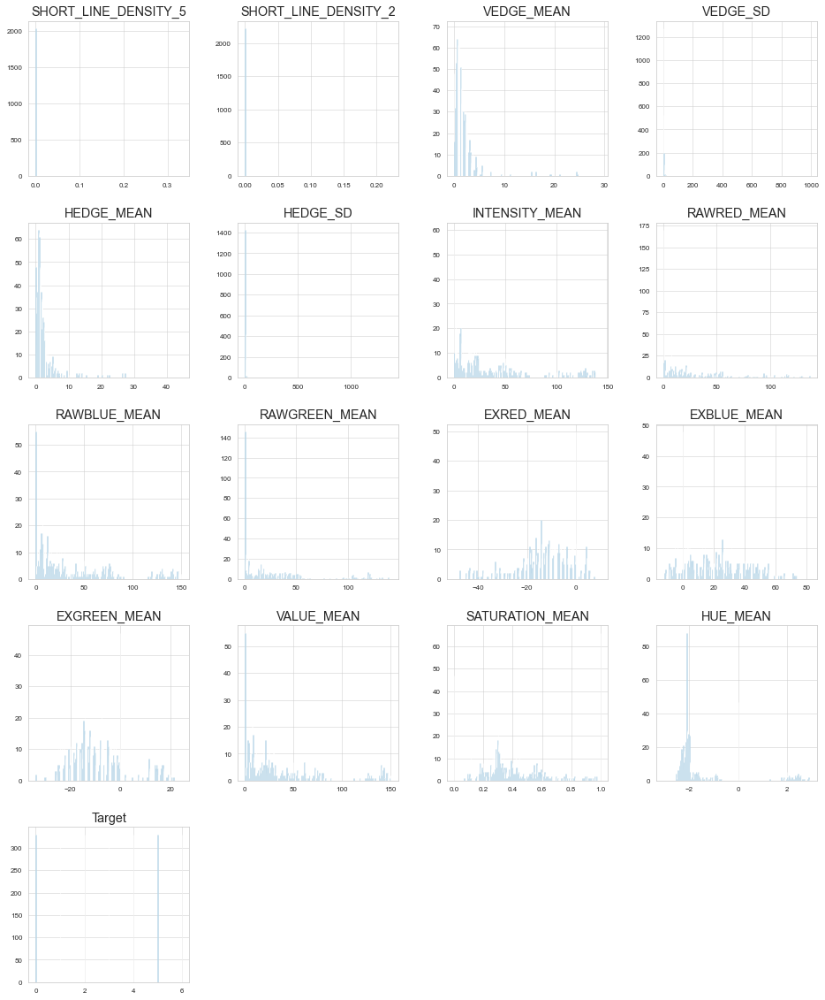

In [43]:
datasets.get('merge').hist(figsize=(16, 20), bins=1000, xlabelsize=8, ylabelsize=8);

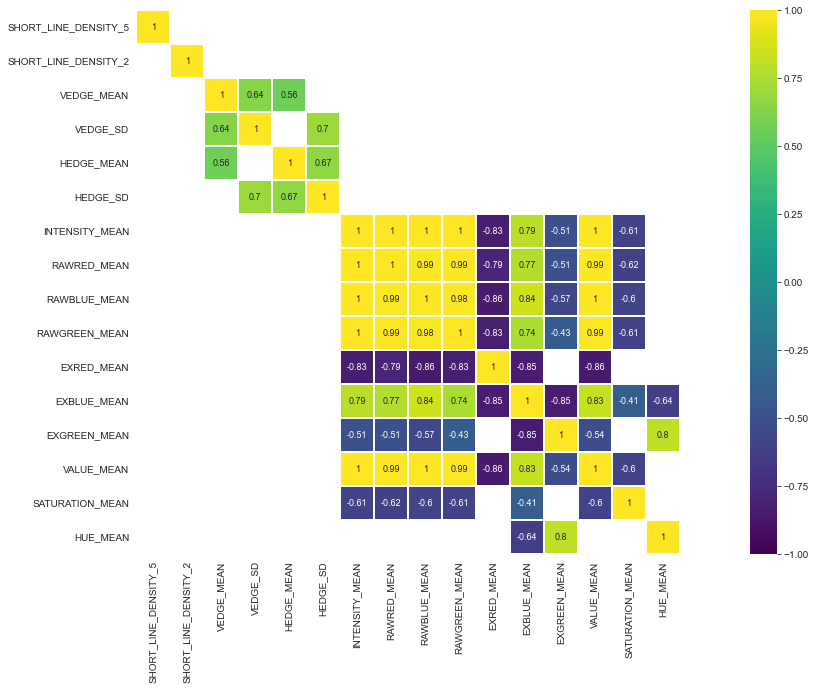

In [44]:
corr = datasets.get('merge')[features].corr() 
plt.figure(figsize=(25, 10))
sns.heatmap(corr[(corr >= 0.5) | (corr <= -0.4)], 
            cmap='viridis', vmax=1.0, vmin=-1.0, linewidths=0.2,
            annot=True, annot_kws={"size": 9}, square=True);
plt.show()

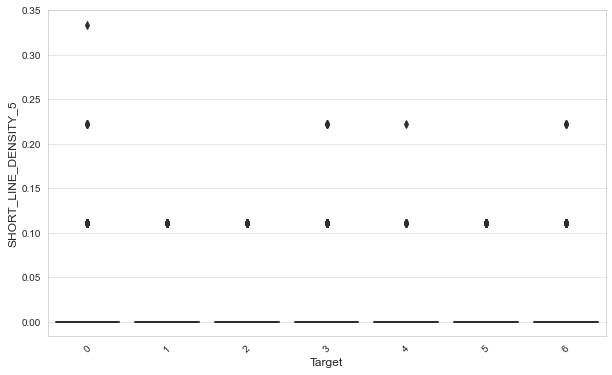

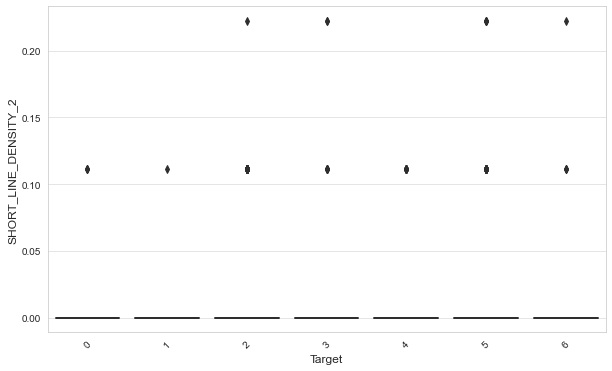

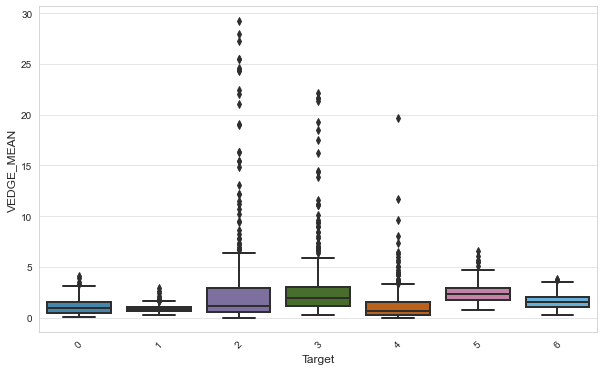

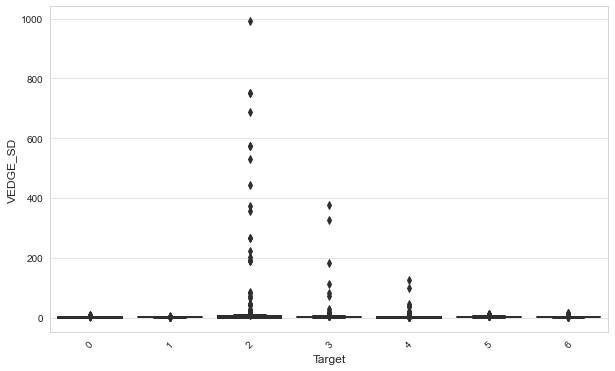

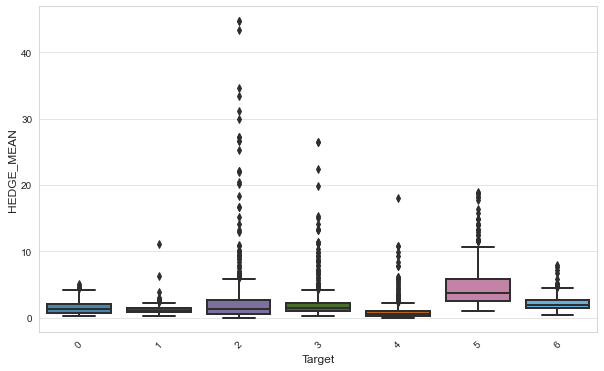

...

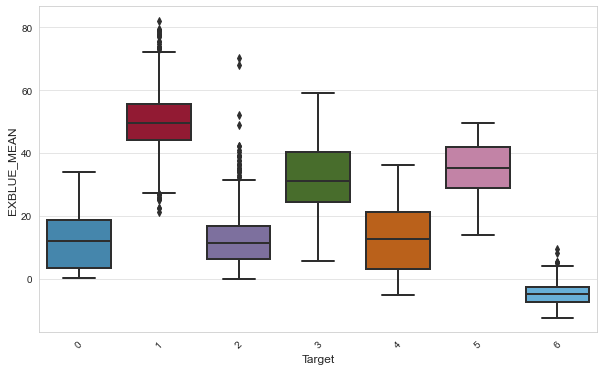

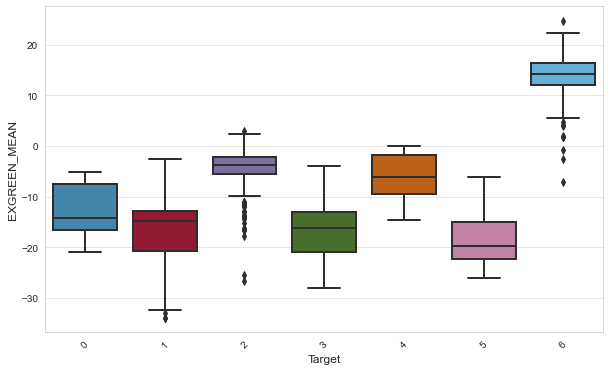

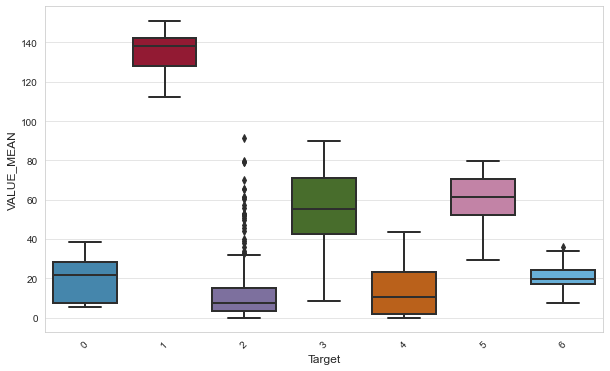

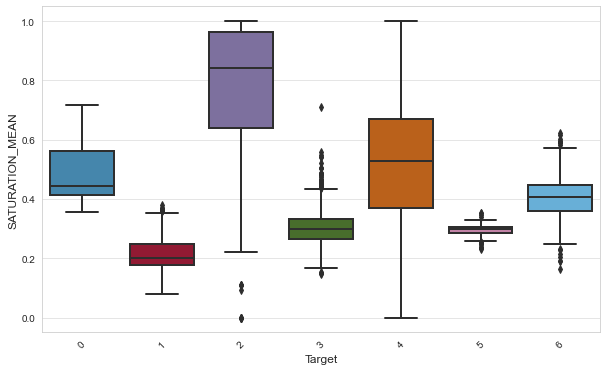

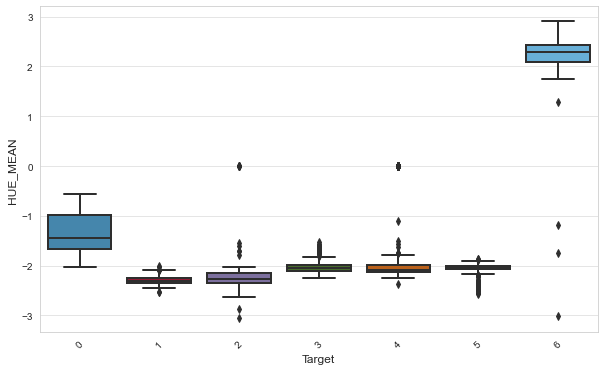

In [45]:
for c in features:
    plt.figure(figsize = (10, 6))
    ax = sns.boxplot(x='Target', y=c, data=datasets.get('merge'))
    plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
    plt.xticks(rotation=45)
    plt.show()

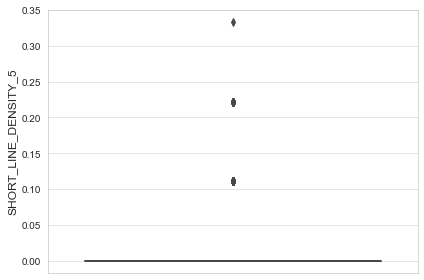

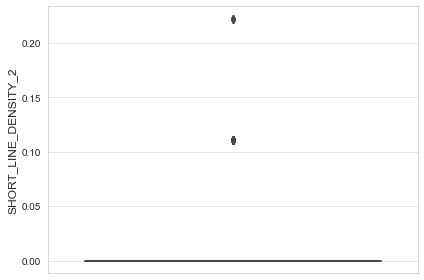

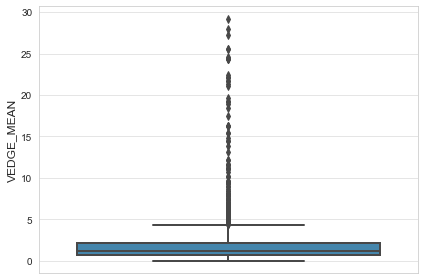

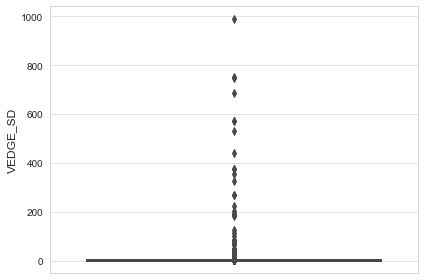

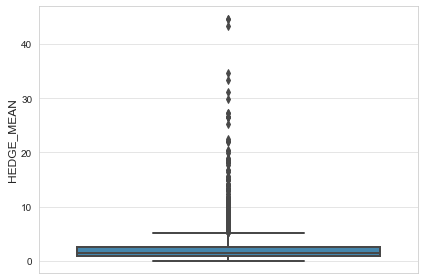

...

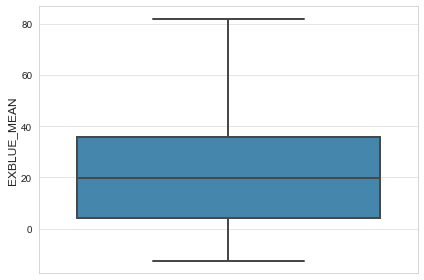

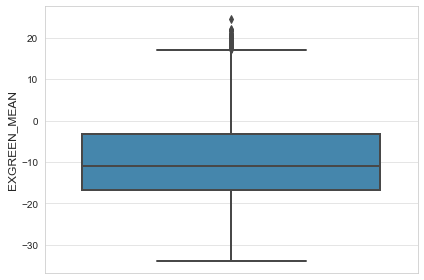

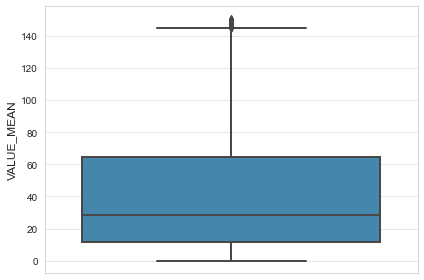

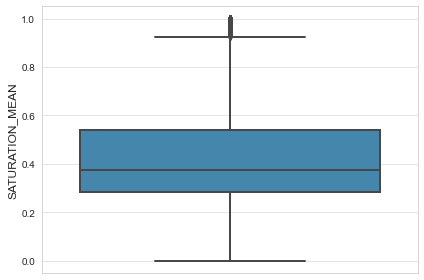

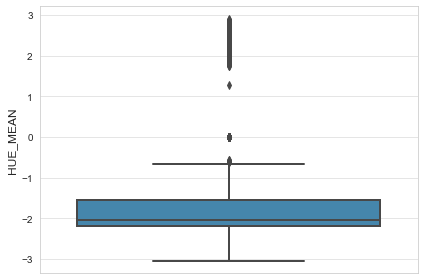

In [46]:
for c_ in features:
    plt.figure(figsize=(6,4))
    sns.boxplot(y=c_, data = datasets.get('merge').drop(columns='Target') )
    plt.xticks(rotation=90)
    plt.tight_layout()

### Scale data

In [47]:
X = datasets.get('merge').drop(columns='Target').values
y = datasets.get('merge').Target.values
data_sca_mm = MinMaxScaler().fit_transform((X))
data_sca_mm=pd.DataFrame(data_sca_mm,columns=features)
data_sca_mm['Target'] = y
datasets_mm = create_data_book(data=data_img_seg,test=data_test_img_seg,merge=data_sca_mm)

In [48]:
X = datasets.get('merge').drop(columns='Target').values
y = datasets.get('merge').Target.values
data_sca_ss = StandardScaler().fit_transform((X))
data_sca_ss=pd.DataFrame(data_sca_ss,columns=features)
data_sca_ss['Target'] = y
datasets_ss = create_data_book(data=data_img_seg,test=data_test_img_seg,merge=data_sca_ss)

####################################################################################################################

### Plot density x class

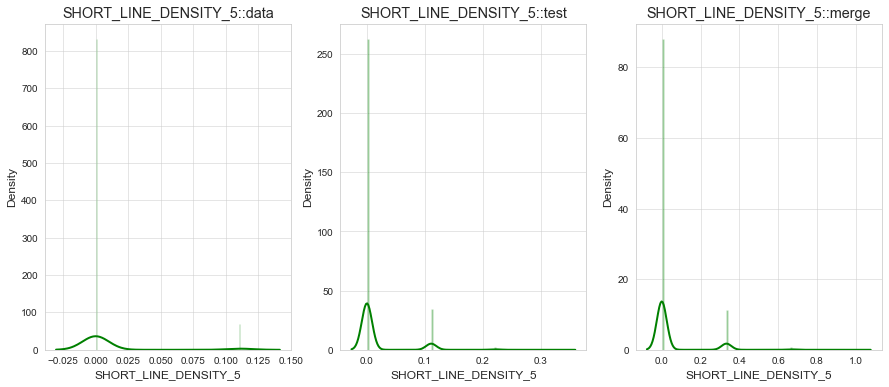

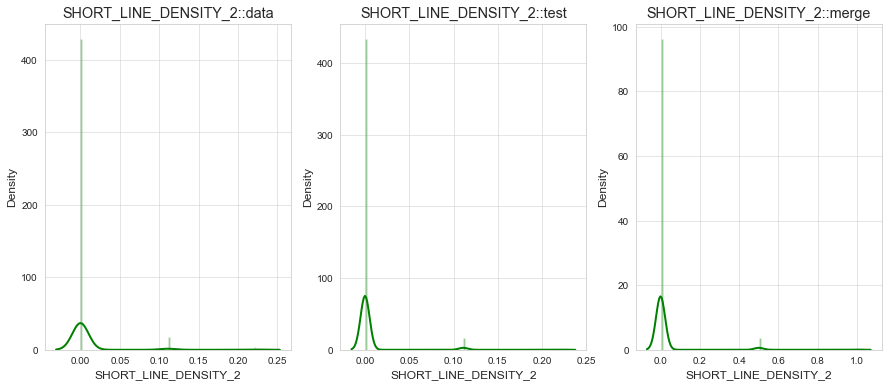

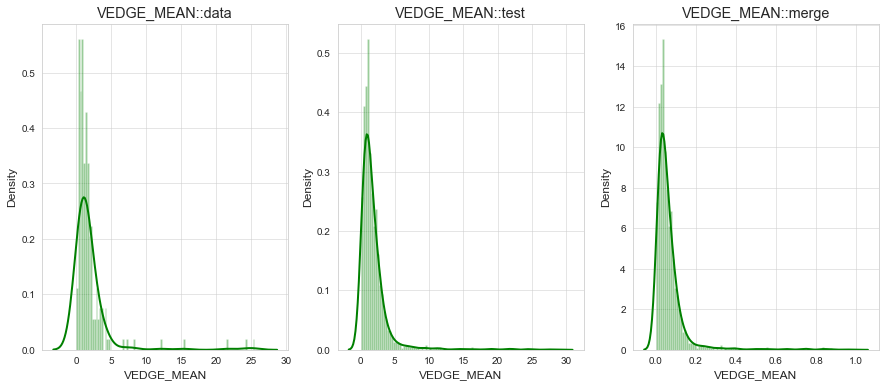

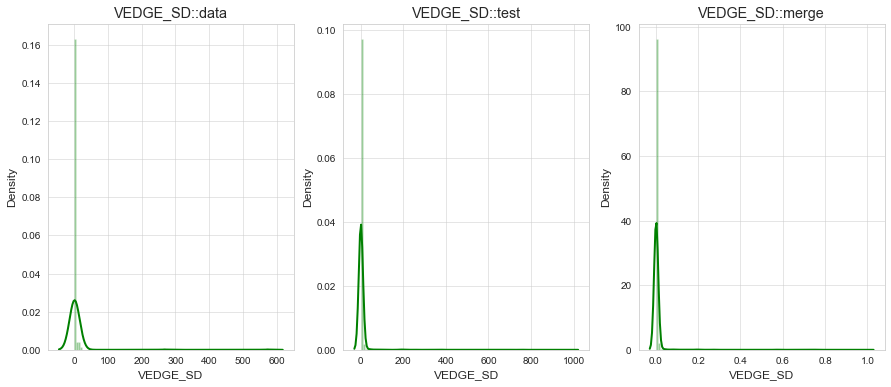

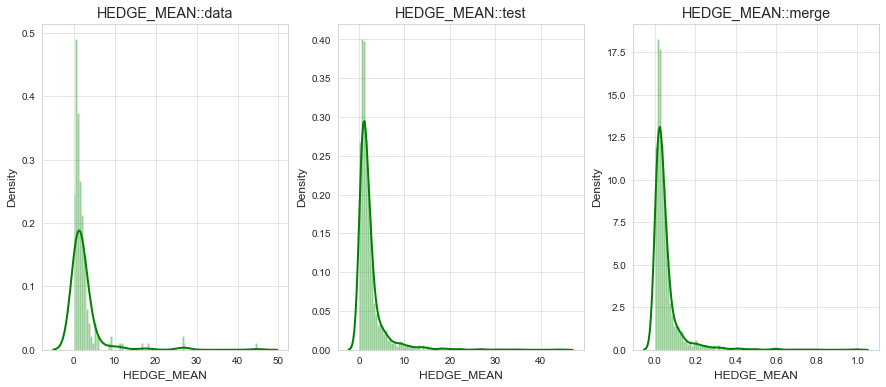

...

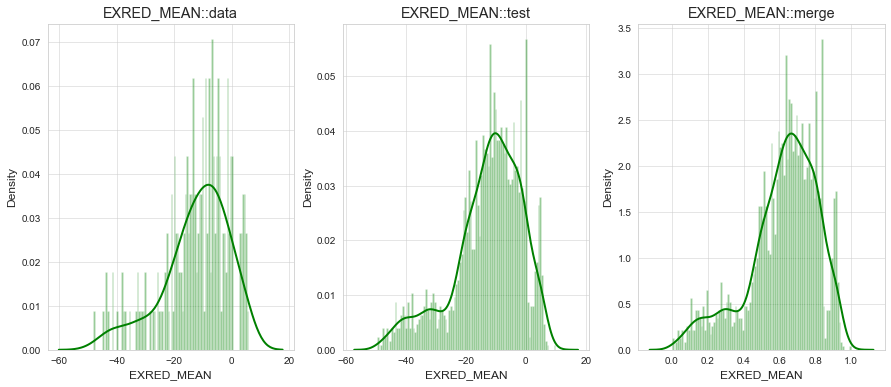

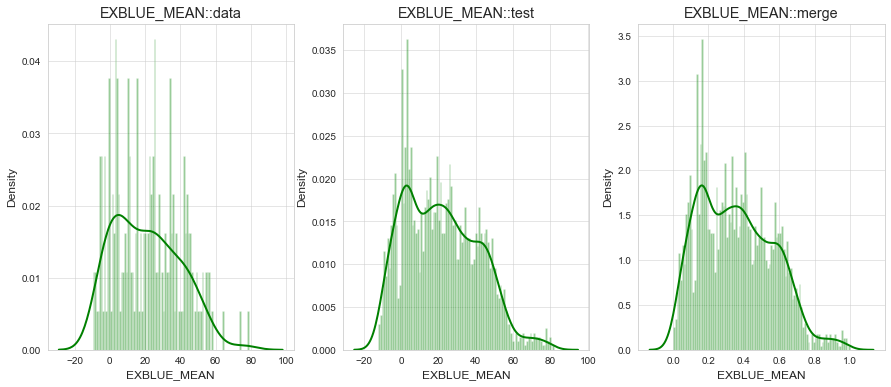

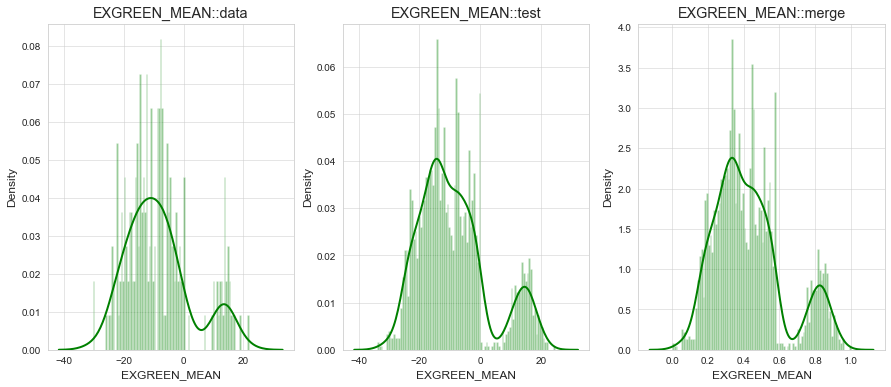

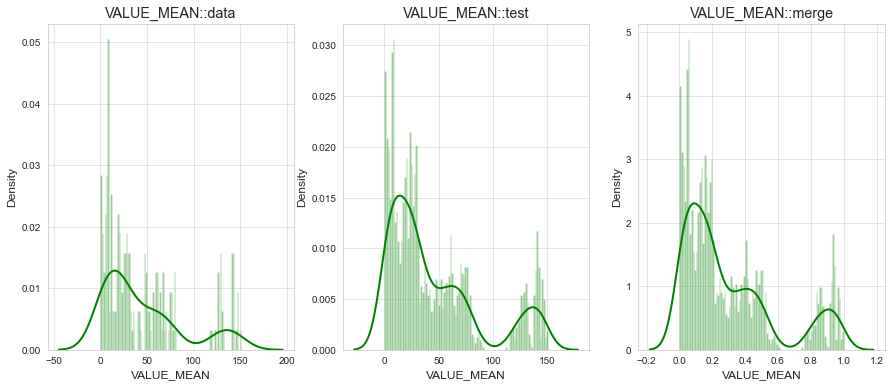

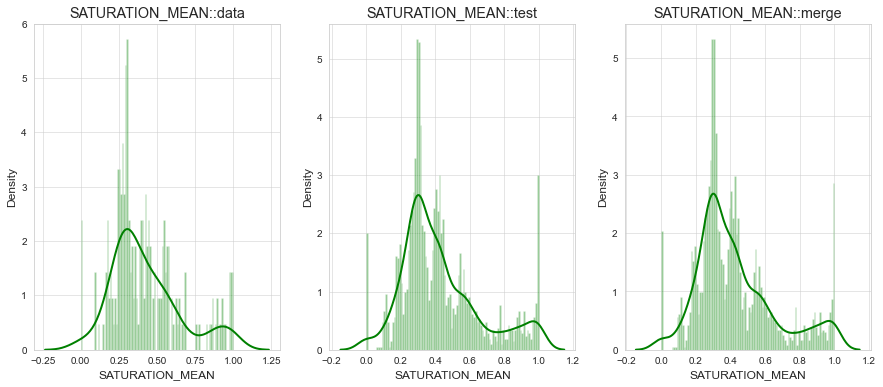

In [49]:
plot_three_data(datasets_mm,features,['data','test','merge'])

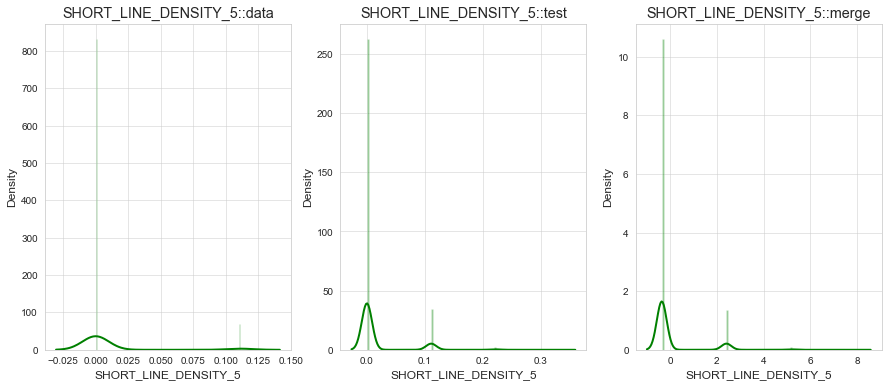

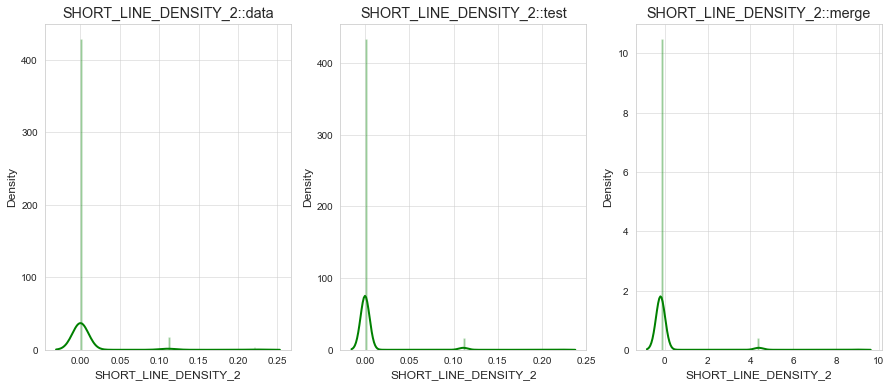

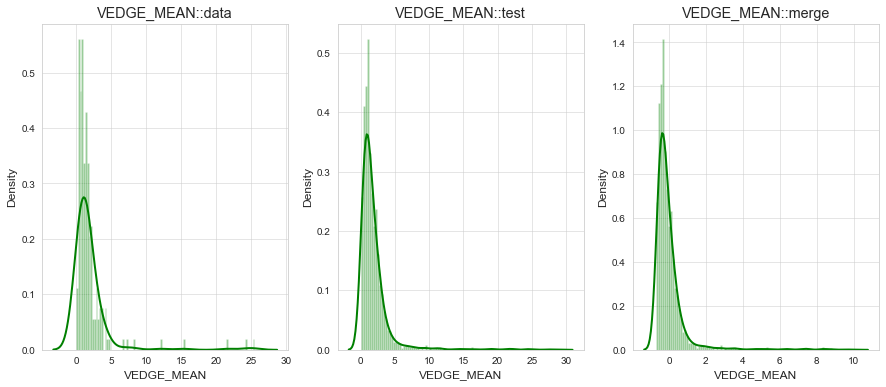

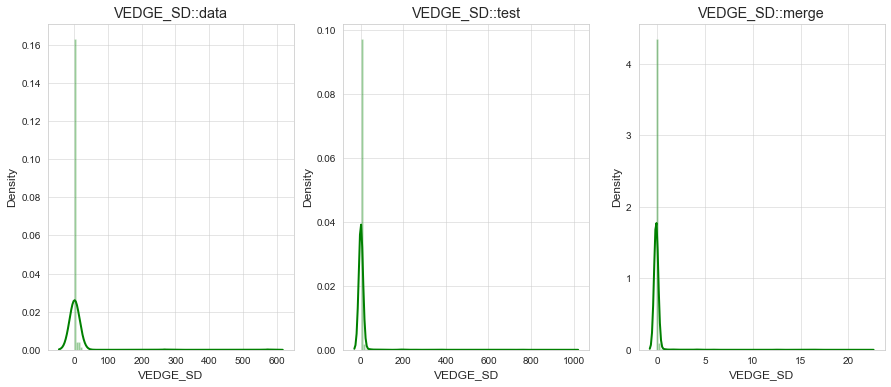

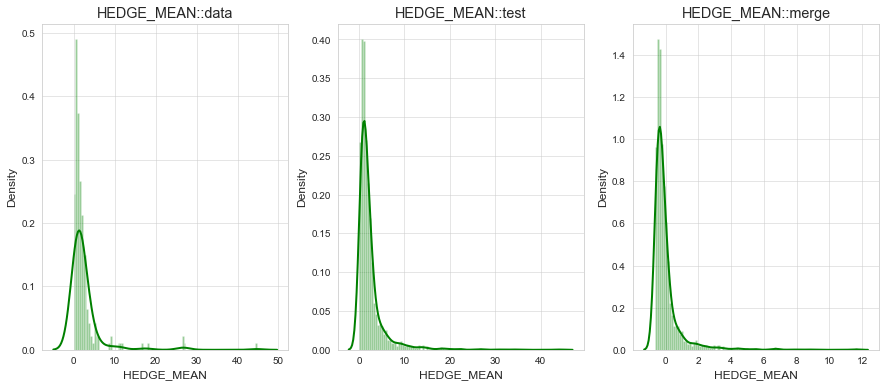

...

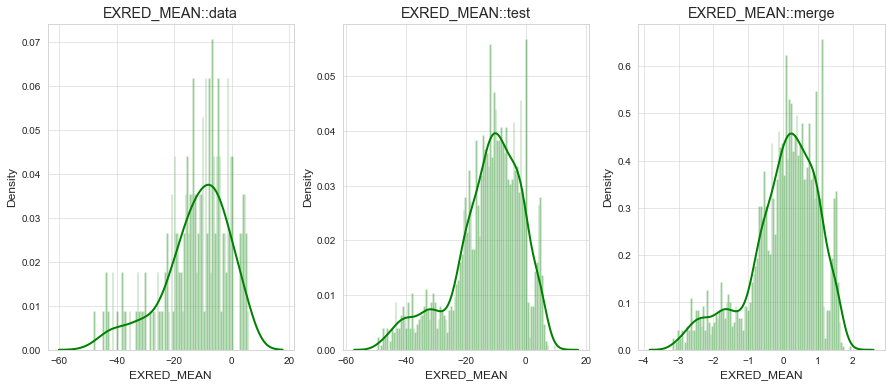

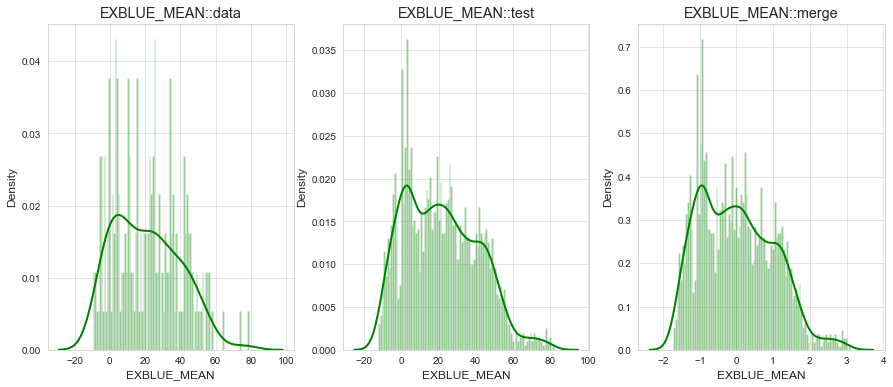

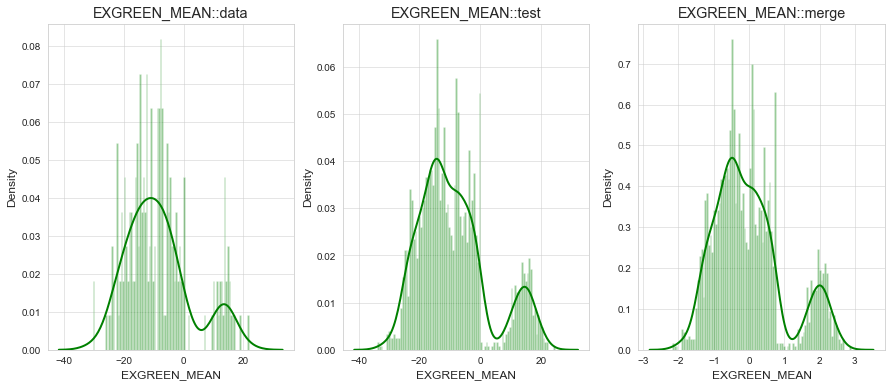

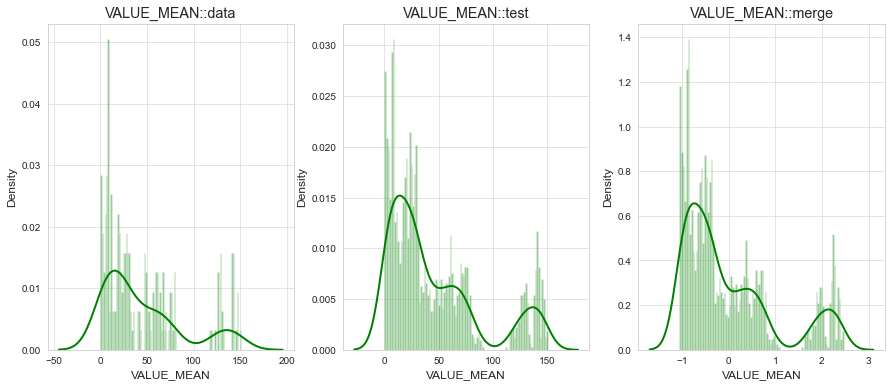

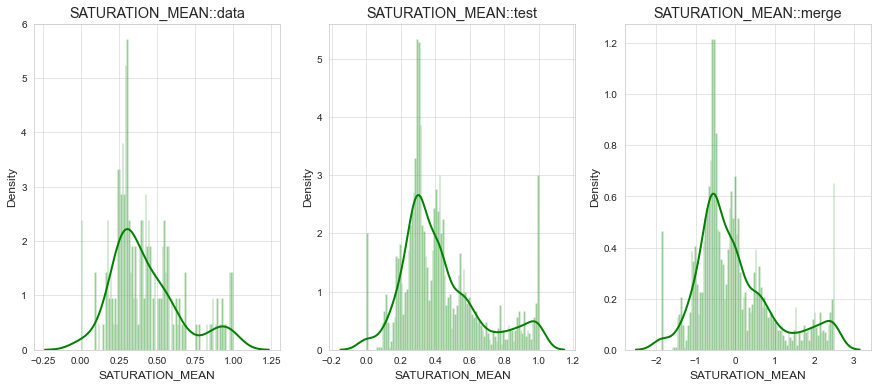

In [50]:
plot_three_data(datasets_ss,features,['data','test','merge'])

####################################################################################################################

### Plot box x class

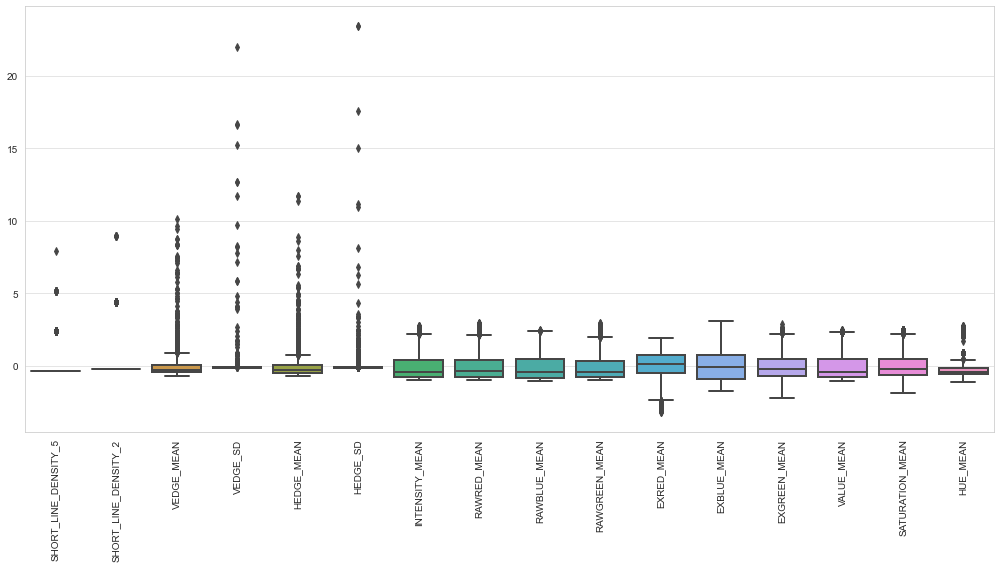

In [51]:
## All
plt.figure(figsize=(14,8))
sns.boxplot( data = datasets_ss.get('merge').drop(columns='Target') )
plt.xticks(rotation=90)  

plt.tight_layout()

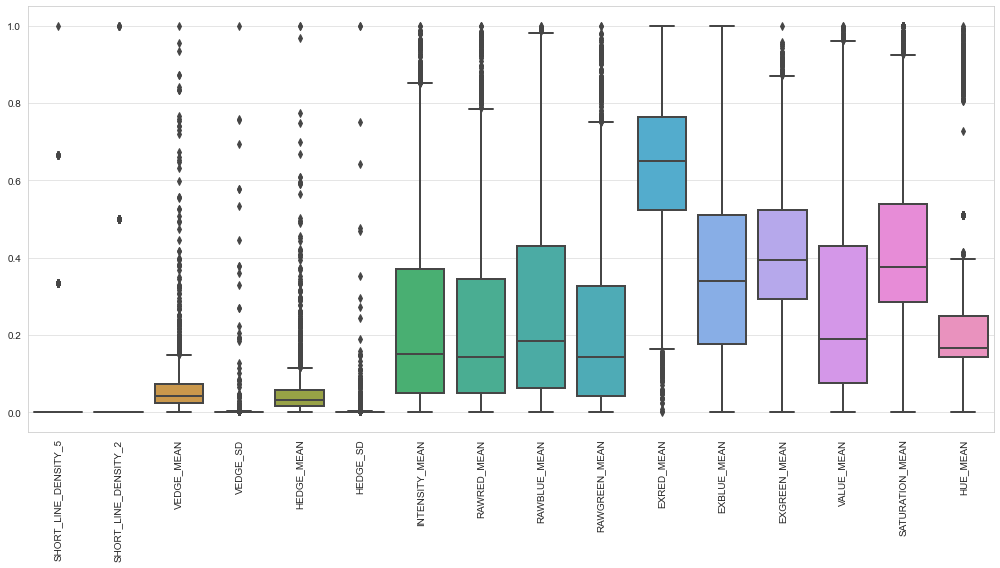

In [52]:
## All
plt.figure(figsize=(14,8))
sns.boxplot( data = datasets_mm.get('merge').drop(columns='Target') )
plt.xticks(rotation=90)  

plt.tight_layout()

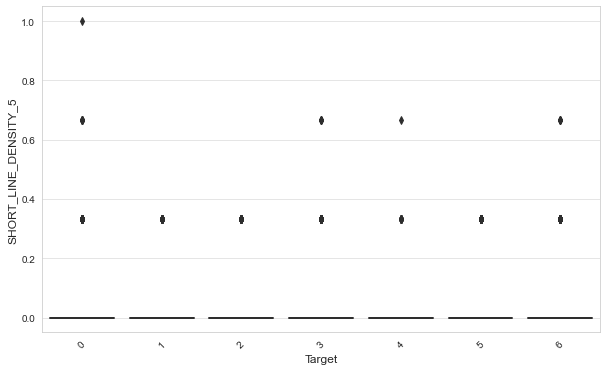

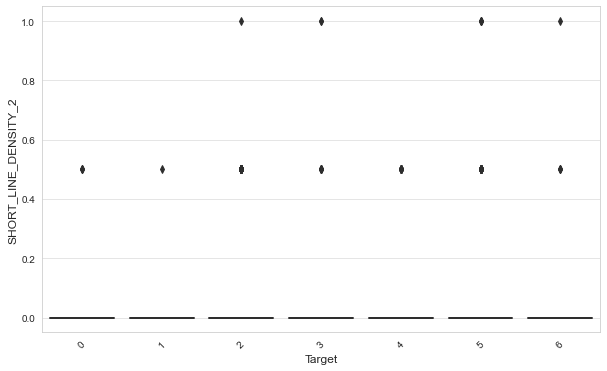

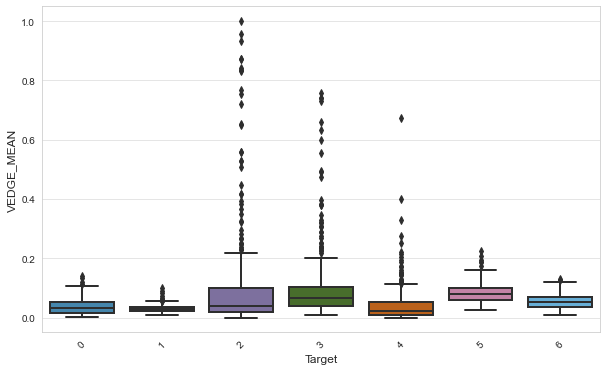

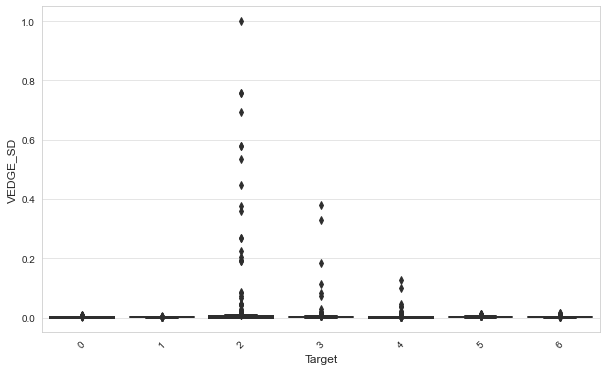

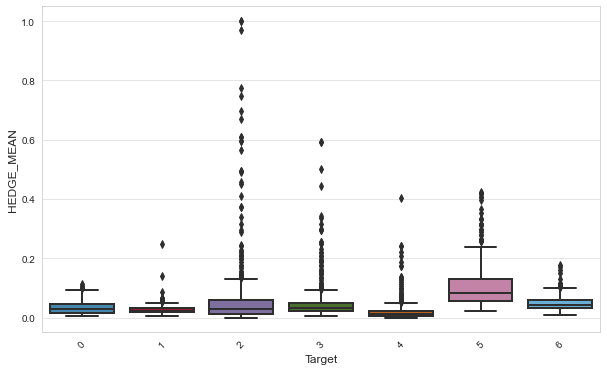

...

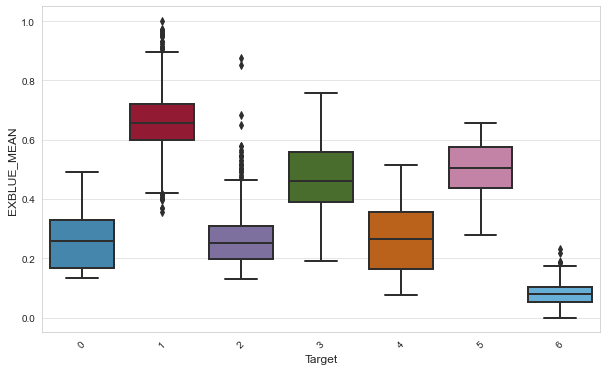

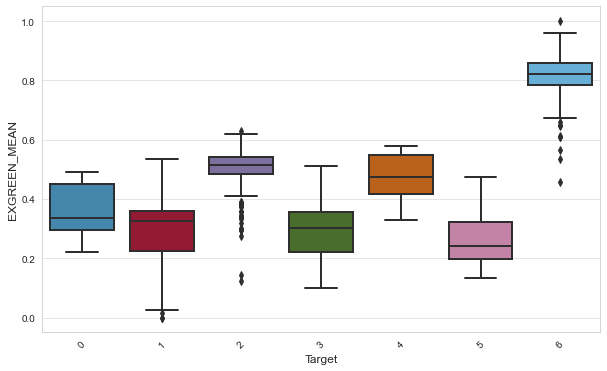

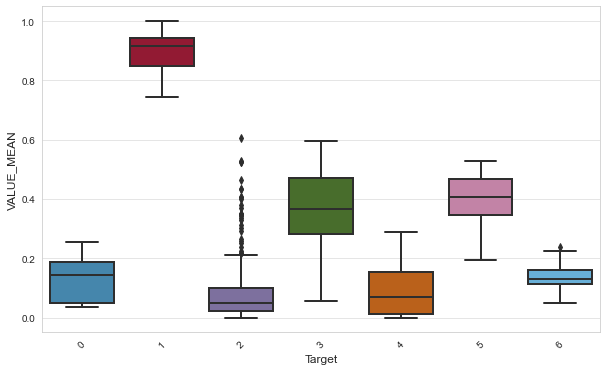

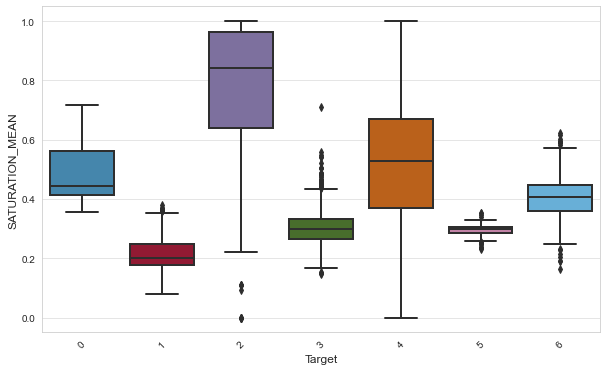

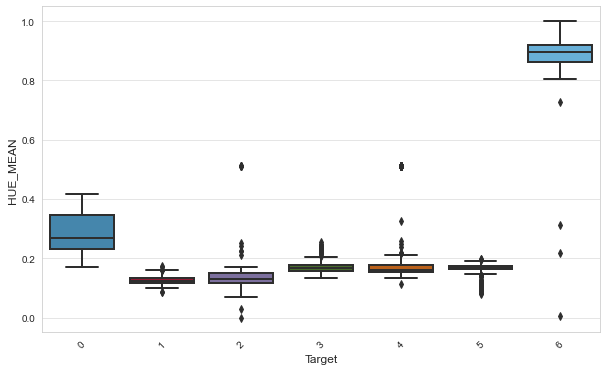

In [53]:
for c in features:
    plt.figure(figsize = (10, 6))
    ax = sns.boxplot(x='Target', y=c, data=datasets_mm.get('merge'))
    plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
    plt.xticks(rotation=45)
    plt.show()

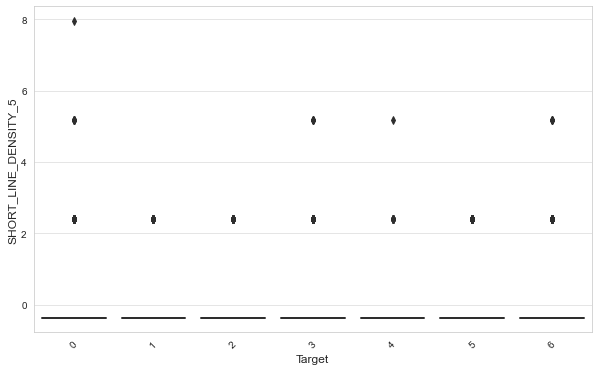

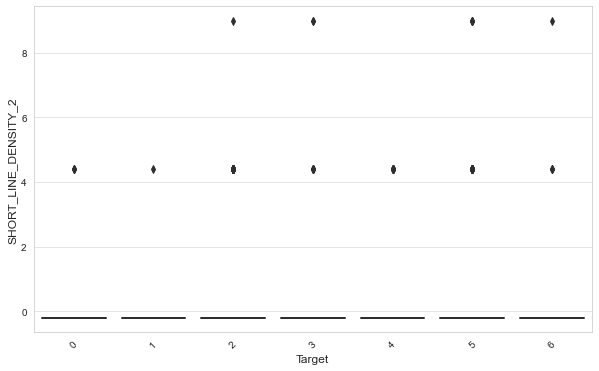

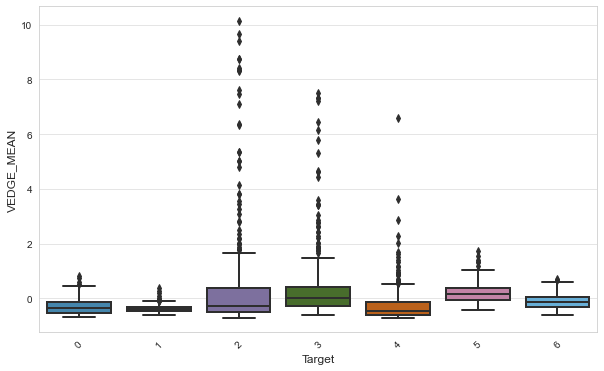

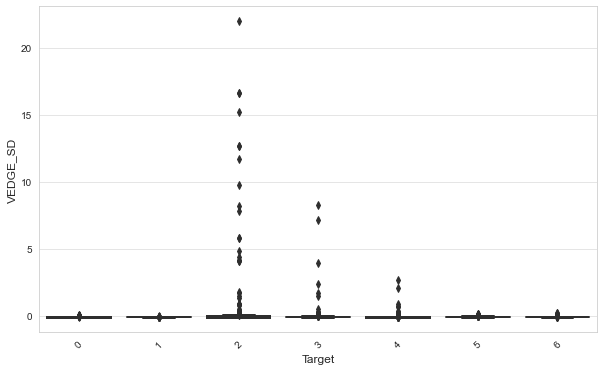

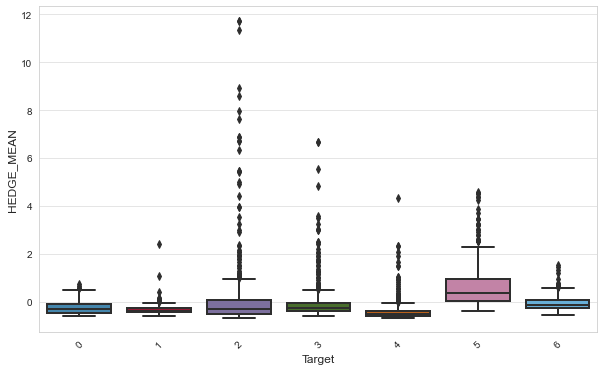

...

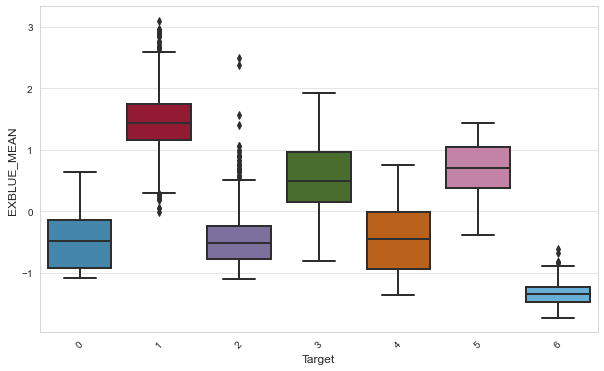

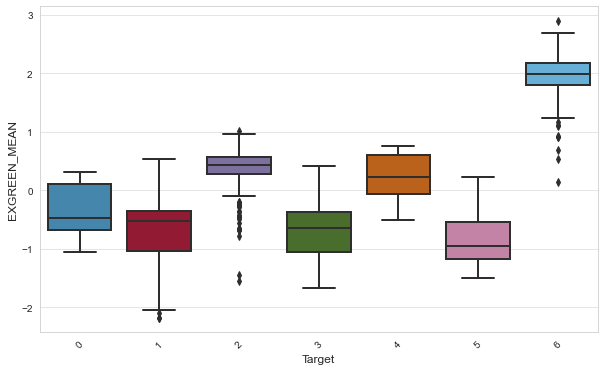

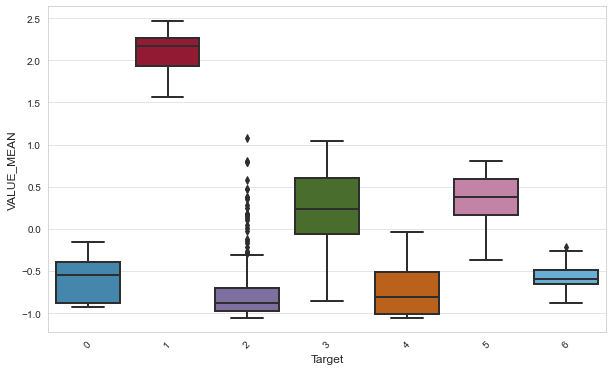

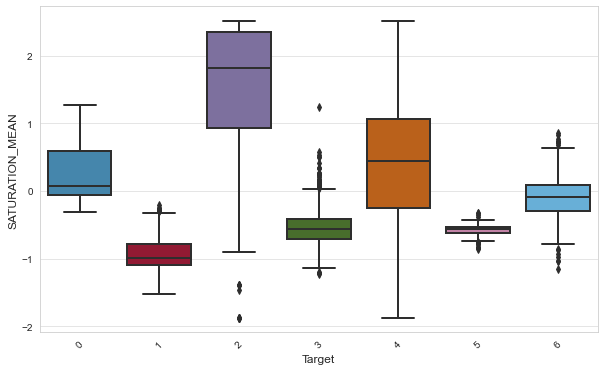

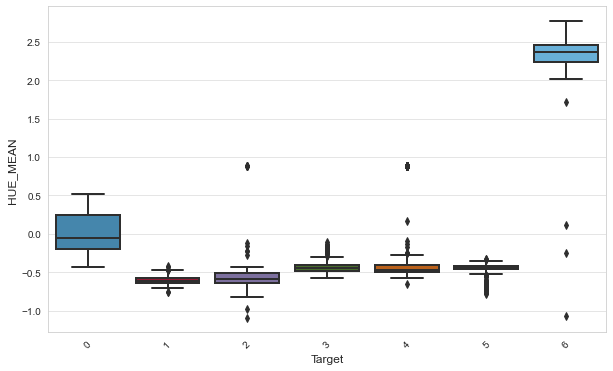

In [54]:
for c in features:
    plt.figure(figsize = (10, 6))
    ax = sns.boxplot(x='Target', y=c, data=datasets_ss.get('merge'))
    plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
    plt.xticks(rotation=45)
    plt.show()

### Pair wise

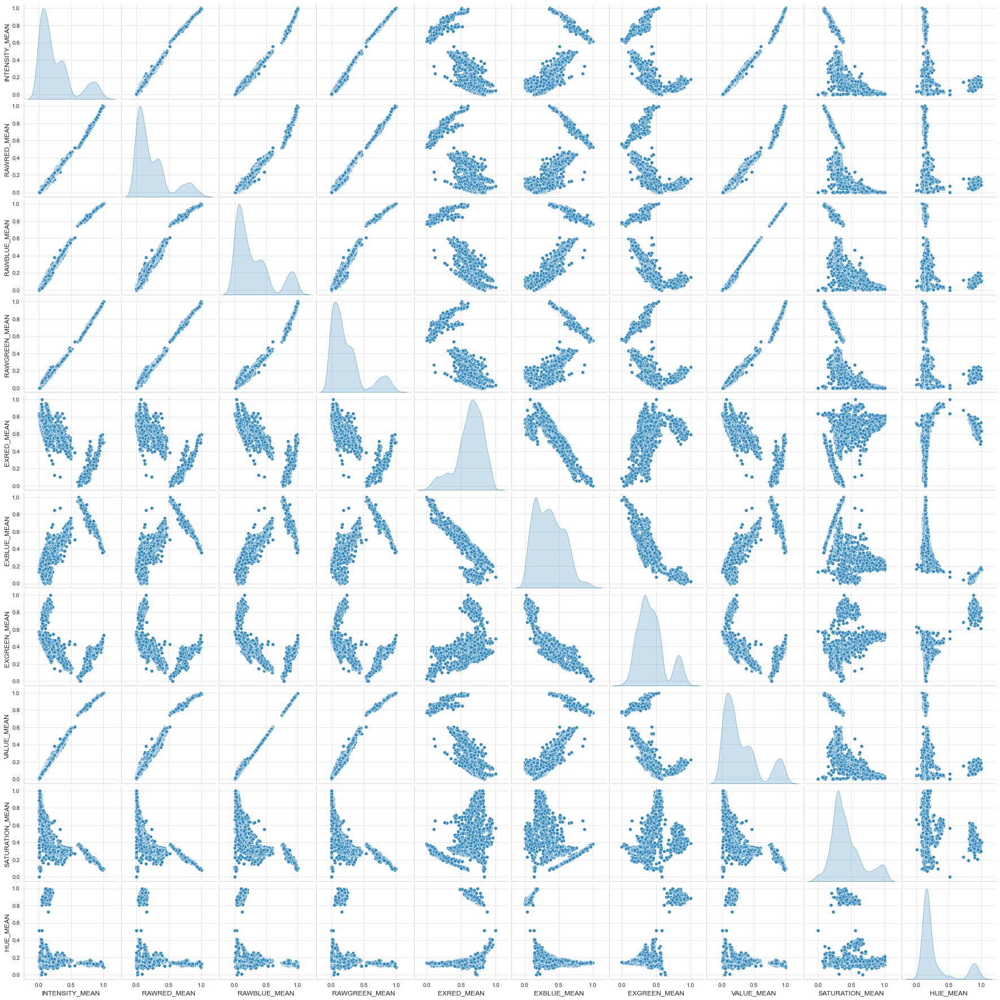

In [55]:
sns.pairplot( datasets_mm.get('merge').drop(columns=['Target']+features[0:6]),  diag_kind="kde",diag_kws=dict(shade=True))

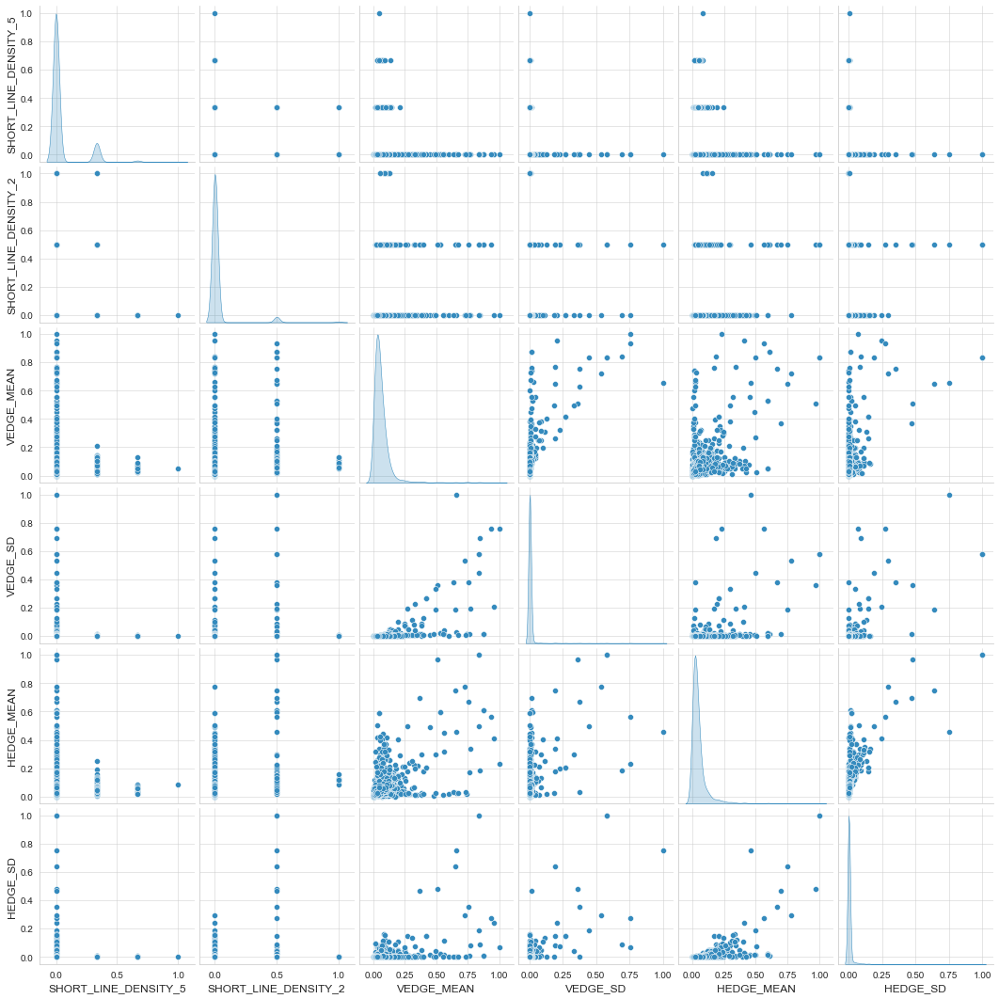

In [56]:
sns.pairplot( datasets_mm.get('merge').drop(columns=['Target']+features[6:]),  diag_kind="kde",diag_kws=dict(shade=True))

In [57]:
#plt.figure(figsize=(23,8))
#data = pd.melt(datasets_mm.get('merge'),id_vars="Target",var_name="features", value_name='value')
#sns.swarmplot(x="features", y="value", hue="Target", data=data)
#plt.xticks(rotation=90) 
#plt.tight_layout()

#############################################################

### Insight Data

In [58]:
MinMaxScaler(feature_range=(0, 1)).fit_transform((datasets.get('merge')['SHORT_LINE_DENSITY_5'].values.reshape(-1,1))).mean()

0.043001441724386746

### Min and Max

In [59]:
## Antes scale
mins = [datasets.get('merge')[col].min() for col in features]
maxs = [datasets.get('merge')[col].max() for col in features]
print("#"*30)
for k,i,j in zip(mins,maxs,features):
    print('feature: {} || Min: {} <==> Max: {} ||'.format(j,k,i))
print("#"*30)

##############################
feature: SHORT_LINE_DENSITY_5 || Min: 0.0 <==> Max: 0.33333334 ||
feature: SHORT_LINE_DENSITY_2 || Min: 0.0 <==> Max: 0.22222222 ||
feature: VEDGE_MEAN || Min: 0.0 <==> Max: 29.222221 ||
feature: VEDGE_SD || Min: 0.0 <==> Max: 991.7184 ||
feature: HEDGE_MEAN || Min: 0.0 <==> Max: 44.722225 ||
feature: HEDGE_SD || Min: -1.5894573e-08 <==> Max: 1386.3292 ||
feature: INTENSITY_MEAN || Min: 0.0 <==> Max: 143.44444 ||
feature: RAWRED_MEAN || Min: 0.0 <==> Max: 137.11111 ||
feature: RAWBLUE_MEAN || Min: 0.0 <==> Max: 150.88889 ||
feature: RAWGREEN_MEAN || Min: 0.0 <==> Max: 142.55556 ||
feature: EXRED_MEAN || Min: -49.666668 <==> Max: 9.888889 ||
feature: EXBLUE_MEAN || Min: -12.444445 <==> Max: 82.0 ||
feature: EXGREEN_MEAN || Min: -33.88889 <==> Max: 24.666666 ||
feature: VALUE_MEAN || Min: 0.0 <==> Max: 150.88889 ||
feature: SATURATION_MEAN || Min: 0.0 <==> Max: 1.0 ||
feature: HUE_MEAN || Min: -3.0441751 <==> Max: 2.9124804 ||
##############################

In [60]:
## MinMax
mins = [datasets_mm.get('merge')[col].min() for col in features]
maxs = [datasets_mm.get('merge')[col].max() for col in features]
print('Min : ',mins)
print("#"*30)
print('Max : ',maxs)

Min :  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
##############################
Max :  [1.0, 0.9999999999999999, 1.0, 1.0, 1.0, 1.0, 0.9999999999999999, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


In [61]:
## Standart
mins = [datasets_ss.get('merge')[col].min() for col in features]
maxs = [datasets_ss.get('merge')[col].max() for col in features]
print('Min : ',mins)
print("#"*30)
print('Max : ',maxs)

Min :  [-0.35704731841352405, -0.19455170047579018, -0.7018948007579852, -0.12733572779380395, -0.6717983787152265, -0.14020173917637282, -0.9707465414154041, -0.9369702431289707, -1.0153922539135503, -0.9391779436645488, -3.192784254389828, -1.730070408770111, -2.179463334383361, -1.0518496863381148, -1.8702049704637373, -1.0882052668618811]
##############################
Max :  [7.946100299333392, 8.977171321954318, 10.127873602196656, 21.991092430317426, 11.719024507209255, 23.437312229466503, 2.787477436296146, 2.977225634021238, 2.4518800529397513, 2.981826269393522, 1.9497145828651654, 3.0965066657702183, 2.8906646430545204, 2.464351601857999, 2.510764207246545, 2.7672328933651578]


### Prepare datasets

In [62]:
# split features
features_dataset_01 = features[:6].copy()
features_dataset_02 = features[6:].copy()
features_dataset_03 = features.copy()

### Config 01
 - StandardScaler : all datasets

### Test

In [63]:
# scale
dataset_01_scaled = datasets.get('merge').drop(columns=['Target']+features_dataset_02).copy()
dataset_02_scaled = datasets.get('merge').drop(columns=['Target']+features_dataset_01).copy()
dataset_03_scaled = datasets.get('merge').drop(columns='Target').copy()

dataset_01_scaled[features_dataset_01] = StandardScaler().fit_transform(dataset_01_scaled.values)
dataset_02_scaled[features_dataset_02] = StandardScaler().fit_transform(dataset_02_scaled.values)
dataset_03_scaled[features_dataset_03] = StandardScaler().fit_transform(dataset_03_scaled.values)

dataset_01_scaled['Target'] = datasets.get('merge').Target.values
dataset_02_scaled['Target'] = datasets.get('merge').Target.values
dataset_03_scaled['Target'] = datasets.get('merge').Target.values

### Train - Hypertuning

In [64]:
# scale
dataset_01_scaled_tuning = datasets.get('data').drop(columns=['Target']+features_dataset_02).copy()
dataset_02_scaled_tuning = datasets.get('data').drop(columns=['Target']+features_dataset_01).copy()
dataset_03_scaled_tuning = datasets.get('data').drop(columns='Target').copy()

dataset_01_scaled_tuning[features_dataset_01] = StandardScaler().fit_transform(dataset_01_scaled_tuning.values)
dataset_02_scaled_tuning[features_dataset_02] = StandardScaler().fit_transform(dataset_02_scaled_tuning.values)
dataset_03_scaled_tuning[features_dataset_03] = StandardScaler().fit_transform(dataset_03_scaled_tuning.values)

dataset_01_scaled_tuning['Target'] = datasets.get('data').Target.values
dataset_02_scaled_tuning['Target'] = datasets.get('data').Target.values
dataset_03_scaled_tuning['Target'] = datasets.get('data').Target.values

### View data

In [65]:
dataset_01_scaled_tuning.head()

,SHORT_LINE_DENSITY_5,SHORT_LINE_DENSITY_2,VEDGE_MEAN,VEDGE_SD,HEDGE_MEAN,HEDGE_SD,Target
0,-0.287183,-0.211604,-0.522856,-0.130359,-0.404770,-0.116586,0
1,-0.287183,-0.211604,-0.505223,-0.125664,-0.439588,-0.118988,0
2,-0.287183,-0.211604,-0.522856,-0.129335,-0.369952,-0.114413,0
3,-0.287183,-0.211604,-0.452325,-0.127969,-0.311923,-0.114909,0
4,-0.287183,-0.211604,-0.381793,-0.123189,-0.358347,-0.115366,0


In [66]:
dataset_02_scaled_tuning.head()

,INTENSITY_MEAN,RAWRED_MEAN,RAWBLUE_MEAN,RAWGREEN_MEAN,EXRED_MEAN,EXBLUE_MEAN,EXGREEN_MEAN,VALUE_MEAN,SATURATION_MEAN,HUE_MEAN,Target
0,-0.800981,-0.722995,-0.831680,-0.831478,1.371334,-0.871709,0.045692,-0.860393,0.539724,0.140503,0
1,-0.788502,-0.694791,-0.829138,-0.822461,1.506224,-0.931072,0.005205,-0.844937,0.508617,0.267136,0
2,-0.802901,-0.716727,-0.841851,-0.831478,1.448414,-0.931072,0.065936,-0.865545,0.482371,0.240698,0
3,-0.809620,-0.710460,-0.859649,-0.837489,1.573669,-1.014181,0.076057,-0.860393,0.663177,0.383191,0
4,-0.804820,-0.732396,-0.831680,-0.834483,1.323159,-0.847963,0.055814,-0.857817,0.615934,0.105821,0


In [67]:
dataset_03_scaled_tuning.head()

,SHORT_LINE_DENSITY_5,SHORT_LINE_DENSITY_2,VEDGE_MEAN,VEDGE_SD,HEDGE_MEAN,HEDGE_SD,INTENSITY_MEAN,RAWRED_MEAN,RAWBLUE_MEAN,RAWGREEN_MEAN,EXRED_MEAN,EXBLUE_MEAN,EXGREEN_MEAN,VALUE_MEAN,SATURATION_MEAN,HUE_MEAN,Target
0,-0.287183,-0.211604,-0.522856,-0.130359,-0.404770,-0.116586,-0.800981,-0.722995,-0.831680,-0.831478,1.371334,-0.871709,0.045692,-0.860393,0.539724,0.140503,0
1,-0.287183,-0.211604,-0.505223,-0.125664,-0.439588,-0.118988,-0.788502,-0.694791,-0.829138,-0.822461,1.506224,-0.931072,0.005205,-0.844937,0.508617,0.267136,0
2,-0.287183,-0.211604,-0.522856,-0.129335,-0.369952,-0.114413,-0.802901,-0.716727,-0.841851,-0.831478,1.448414,-0.931072,0.065936,-0.865545,0.482371,0.240698,0
3,-0.287183,-0.211604,-0.452325,-0.127969,-0.311923,-0.114909,-0.809620,-0.710460,-0.859649,-0.837489,1.573669,-1.014181,0.076057,-0.860393,0.663177,0.383191,0
4,-0.287183,-0.211604,-0.381793,-0.123189,-0.358347,-0.115366,-0.804820,-0.732396,-0.831680,-0.834483,1.323159,-0.847963,0.055814,-0.857817,0.615934,0.105821,0


In [68]:
dataset_01_scaled.head()

,SHORT_LINE_DENSITY_5,SHORT_LINE_DENSITY_2,VEDGE_MEAN,VEDGE_SD,HEDGE_MEAN,HEDGE_SD,Target
0,-0.357047,-0.194552,-0.598950,-0.125931,-0.487090,-0.134911,0
1,-0.357047,-0.194552,-0.578361,-0.121388,-0.533267,-0.138879,0
2,-0.357047,-0.194552,-0.598950,-0.124940,-0.440914,-0.131320,0
3,-0.357047,-0.194552,-0.516594,-0.123619,-0.363952,-0.132139,0
4,-0.357047,-0.194552,-0.434239,-0.118993,-0.425521,-0.132895,0


In [69]:
dataset_02_scaled.head()

,INTENSITY_MEAN,RAWRED_MEAN,RAWBLUE_MEAN,RAWGREEN_MEAN,EXRED_MEAN,EXBLUE_MEAN,EXGREEN_MEAN,VALUE_MEAN,SATURATION_MEAN,HUE_MEAN,Target
0,-0.808696,-0.727621,-0.839220,-0.841382,1.393250,-0.866965,0.071789,-0.870602,0.520205,0.156038,0
1,-0.796081,-0.699073,-0.836667,-0.832214,1.527569,-0.923748,0.033306,-0.855067,0.489298,0.283547,0
2,-0.810636,-0.721277,-0.849433,-0.841382,1.470004,-0.923748,0.091031,-0.875781,0.463221,0.256926,0
3,-0.817429,-0.714933,-0.867306,-0.847494,1.594729,-1.003245,0.100651,-0.870602,0.642864,0.400405,0
4,-0.812577,-0.737137,-0.839220,-0.844438,1.345279,-0.844252,0.081410,-0.868013,0.595925,0.121116,0


In [70]:
dataset_03_scaled.head()

,SHORT_LINE_DENSITY_5,SHORT_LINE_DENSITY_2,VEDGE_MEAN,VEDGE_SD,HEDGE_MEAN,HEDGE_SD,INTENSITY_MEAN,RAWRED_MEAN,RAWBLUE_MEAN,RAWGREEN_MEAN,EXRED_MEAN,EXBLUE_MEAN,EXGREEN_MEAN,VALUE_MEAN,SATURATION_MEAN,HUE_MEAN,Target
0,-0.357047,-0.194552,-0.598950,-0.125931,-0.487090,-0.134911,-0.808696,-0.727621,-0.839220,-0.841382,1.393250,-0.866965,0.071789,-0.870602,0.520205,0.156038,0
1,-0.357047,-0.194552,-0.578361,-0.121388,-0.533267,-0.138879,-0.796081,-0.699073,-0.836667,-0.832214,1.527569,-0.923748,0.033306,-0.855067,0.489298,0.283547,0
2,-0.357047,-0.194552,-0.598950,-0.124940,-0.440914,-0.131320,-0.810636,-0.721277,-0.849433,-0.841382,1.470004,-0.923748,0.091031,-0.875781,0.463221,0.256926,0
3,-0.357047,-0.194552,-0.516594,-0.123619,-0.363952,-0.132139,-0.817429,-0.714933,-0.867306,-0.847494,1.594729,-1.003245,0.100651,-0.870602,0.642864,0.400405,0
4,-0.357047,-0.194552,-0.434239,-0.118993,-0.425521,-0.132895,-0.812577,-0.737137,-0.839220,-0.844438,1.345279,-0.844252,0.081410,-0.868013,0.595925,0.121116,0


### Save data

In [71]:
## Check file exists
#data_name = ['dataset_01_scaled_tuning','dataset_02_scaled_tuning','dataset_03_scaled_tuning']
#for name in data_name:
#    if os.path.exists(os.path.join('../input/', '.'.join([name, 'csv']))):
#        os.remove(os.path.join('../input/', '.'.join([name, 'csv'])))
#dataset_01_scaled_tuning.to_csv("../input/dataset_01_scaled_tuning.csv", index = False)
#dataset_02_scaled_tuning.to_csv("../input/dataset_02_scaled_tuning.csv", index = False)
#dataset_03_scaled_tuning.to_csv("../input/dataset_03_scaled_tuning.csv", index = False)

In [72]:
## Check file exists
#data_name = ['dataset_01_scaled','dataset_02_scaled','dataset_03_scaled']
#for name in data_name:
#    if os.path.exists(os.path.join('../input/', '.'.join([name, 'csv']))):
#        os.remove(os.path.join('../input/', '.'.join([name, 'csv'])))
#dataset_01_scaled.to_csv("../input/dataset_01_scaled.csv", index = False)
#dataset_02_scaled.to_csv("../input/dataset_02_scaled.csv", index = False)
#dataset_03_scaled.to_csv("../input/dataset_03_scaled.csv", index = False)

# TODO
### Config 02
 - dataset_01 : StandardScaler
 - dataset_02 : dataset_01